In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
from PIL import Image
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from tqdm import tqdm
import glob
import os
import seaborn as sns
import scipy
import glob
import sklearn 
from tqdm import tqdm
from sklearn.metrics import pairwise_distances
from sklearn.cluster import AffinityPropagation
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import fcluster, linkage
from sklearn.utils import shuffle

In [2]:
# Latent Space 1
folder_name_1 = 'Full_LSPs'
file_name_1 = 'AE1_LSP_Full'

# Latent Space 2
folder_name_2 = 'Full_LSPs'
file_name_2 = 'AE2_LSP_Full'

# Latent Space 3
# folder_name_3 = ''
# file_name_3 = ''

## Clustering

In [3]:
# read in and plot the original data set
latent = pd.read_pickle(f'{folder_name_1}/{file_name_1}')

In [4]:
print(latent)

               x         y
0     -11.046638 -1.235231
1     -12.144704  1.552626
2     -12.580276  1.627801
3     -11.825569  1.481707
4     -11.692920  1.484967
...          ...       ...
79995  -1.129888  0.181655
79996  -1.226347  0.174260
79997  -1.215803  0.177293
79998  -1.224317  0.152673
79999  -1.226259  0.145292

[80000 rows x 2 columns]


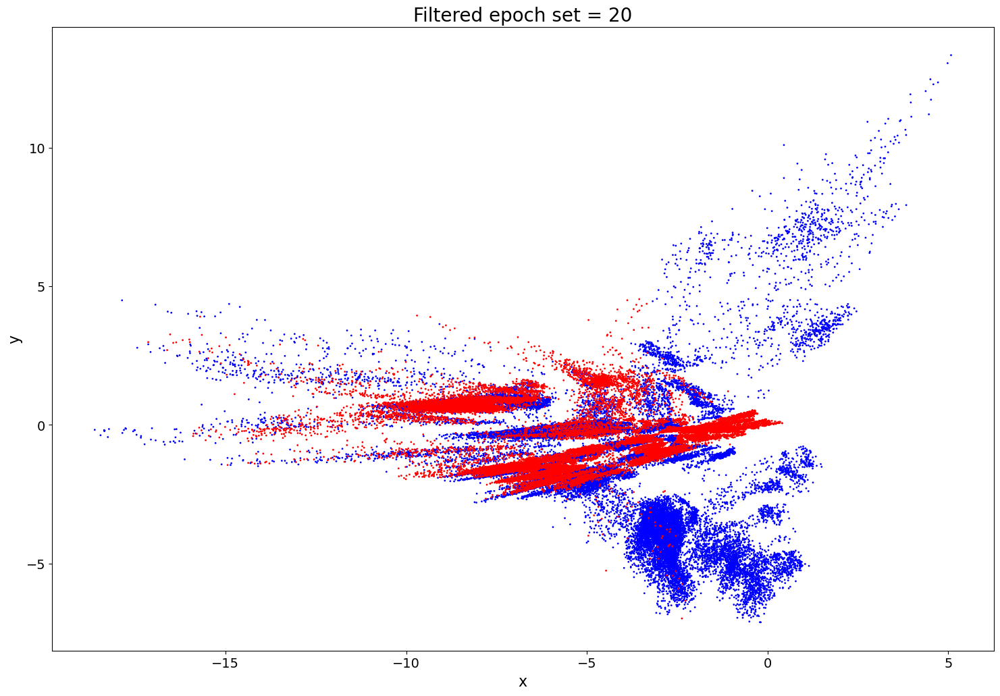

In [6]:
colors = np.array(['blue'] * 40000 + ['red'] * 40000)

plt.figure(figsize=(18,12))
plt.scatter(latent.x, latent.y, c=colors, s=1, alpha=1)
plt.title('Filtered epoch set = 20', fontsize=20)
plt.xlabel('x', fontsize=16)
plt.ylabel('y', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.show()

# Custering Round 2

In [7]:
# read in and plot the original data set
latent_2 = pd.read_pickle(f'{folder_name_2}/{file_name_2}')

In [8]:
print(latent_2)

              x          y
0      5.095377 -10.419563
1      5.142610 -10.451340
2      5.362576 -10.832550
3      5.043651 -10.164100
4      4.932125  -9.969437
...         ...        ...
79995 -0.054606  -0.507709
79996 -0.060310  -0.542439
79997 -0.067674  -0.529473
79998 -0.041885  -0.526254
79999 -0.048491  -0.509500

[80000 rows x 2 columns]


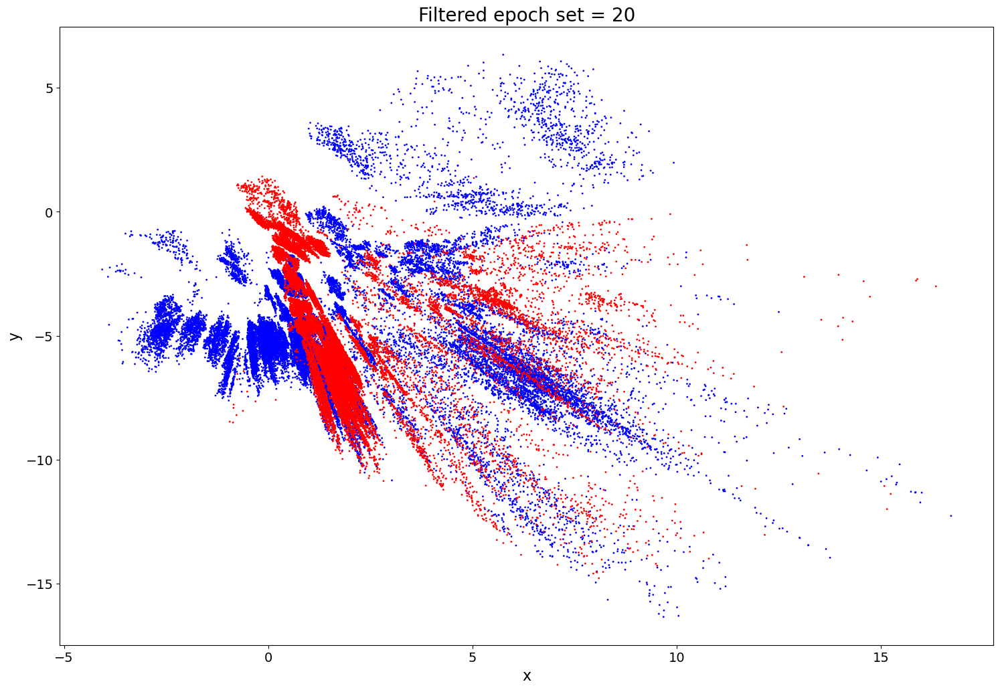

In [10]:
colors = np.array(['blue'] * 40000 + ['red'] * 40000)

plt.figure(figsize=(18,12))
plt.scatter(latent_2.x, latent_2.y, c=colors, s=1, alpha=1)
plt.title('Filtered epoch set = 20', fontsize=20)
plt.xlabel('x', fontsize=16)
plt.ylabel('y', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.show()

# Clustering

In [ ]:
# Extract the x and y coordinates for clustering
latent_coords = latent[['x', 'y']].values
latent_2_coords = latent_2[['x', 'y']].values

# Normalize the data
scaler = StandardScaler()
latent_coords_scaled = scaler.fit_transform(latent_coords)
latent_2_coords_scaled = scaler.fit_transform(latent_2_coords)

# Agglomerative clustering on both latent spaces
linkage_matrix1 = linkage(latent_coords_scaled, method='ward')
linkage_matrix2 = linkage(latent_2_coords_scaled, method='ward')

# Threshold distance for forming flat clusters
threshold = 1.0  

# Form flat clusters based on the threshold
clusters1 = fcluster(linkage_matrix1, t=threshold, criterion='distance')
clusters2 = fcluster(linkage_matrix2, t=threshold, criterion='distance')

# Combine the cluster assignments from both latent spaces
combined_clusters = np.vstack((clusters1, clusters2)).T

# Find consensus clusters
consensus_clusters = {}
for i, (c1, c2) in enumerate(combined_clusters):
    if (c1, c2) not in consensus_clusters:
        consensus_clusters[(c1, c2)] = []
    consensus_clusters[(c1, c2)].append(int(latent.iloc[i, 0]))

# Filter out singleton clusters (clusters with only one member)
consensus_clusters = {k: v for k, v in consensus_clusters.items() if len(v) > 10}

# Calculate cluster sizes for plotting
cluster_sizes = {k: len(v) for k, v in consensus_clusters.items()}

# Visualization function
def plot_clusters(latent, clusters, cluster_sizes, title):
    cluster_count = pd.Series(clusters).value_counts()
    sizes = cluster_count.loc[clusters].values
    
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(latent['x'], latent['y'], c=clusters, s=sizes, cmap='viridis', marker='o', alpha=0.6)
    plt.title(title)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.colorbar(scatter, label='Cluster')
    plt.show()

# Add cluster labels to the DataFrames for plotting
latent['cluster'] = clusters1
latent_2['cluster'] = clusters2

# Plot clusters in each latent space
plot_clusters(latent, latent['cluster'], cluster_sizes, 'Clusters in Latent Space 1')
plot_clusters(latent_2, latent_2['cluster'], cluster_sizes, 'Clusters in Latent Space 2')

# Batched Clustering:

In [ ]:
# Function to perform clustering in batches
def batch_clustering(data, batch_size, threshold):
    clusters = []
    start = 0
    while start < data.shape[0]:
        end = min(start + batch_size, data.shape[0])
        batch = data[start:end]
        linkage_matrix = linkage(batch, method='ward')
        batch_clusters = fcluster(linkage_matrix, t=threshold, criterion='distance')
        clusters.extend(batch_clusters)
        start = end
    return np.array(clusters)

# Shuffle the data to ensure batches are random
latent = shuffle(latent)
latent_2 = shuffle(latent_2)

# Extract the x and y coordinates for clustering
latent_coords = latent[['x', 'y']].values
latent_2_coords = latent_2[['x', 'y']].values

# Normalize the data
scaler = StandardScaler()
latent_coords_scaled = scaler.fit_transform(latent_coords)
latent_2_coords_scaled = scaler.fit_transform(latent_2_coords)

# Define batch size and threshold
batch_size = 20000 
threshold = 1.0  # Adjust based on your data distribution

# Perform incremental hierarchical clustering on both latent spaces
clusters1 = batch_clustering(latent_coords_scaled, batch_size, threshold)
clusters2 = batch_clustering(latent_2_coords_scaled, batch_size, threshold)

# Combine the cluster assignments from both latent spaces
combined_clusters = np.vstack((clusters1, clusters2)).T

# Find consensus clusters
consensus_clusters = {}
for i, (c1, c2) in enumerate(combined_clusters):
    if (c1, c2) not in consensus_clusters:
        consensus_clusters[(c1, c2)] = []
    consensus_clusters[(c1, c2)].append(int(latent.iloc[i, 0]))  # Capture indices correctly

# Filter out singleton clusters (clusters with only one member)
consensus_clusters = {k: v for k, v in consensus_clusters.items() if len(v) > 10}

# Calculate cluster sizes for plotting
cluster_sizes = {k: len(v) for k, v in consensus_clusters.items()}

# Visualization function
def plot_clusters(latent, clusters, cluster_sizes, title):
    cluster_count = pd.Series(clusters).value_counts()
    sizes = cluster_count.loc[clusters].values
    
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(latent['x'], latent['y'], c=clusters, s=sizes, cmap='viridis', marker='o', alpha=0.6)
    plt.title(title)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.colorbar(scatter, label='Cluster')
    plt.show()

# Add cluster labels to the DataFrames for plotting
latent['cluster'] = clusters1
latent_2['cluster'] = clusters2

# Plot clusters in each latent space
plot_clusters(latent, latent['cluster'], cluster_sizes, 'Clusters in Latent Space 1')
plot_clusters(latent_2, latent_2['cluster'], cluster_sizes, 'Clusters in Latent Space 2')

In [13]:
# Group the DataFrame by 'cluster' and print the indices sorted by the cluster
clustered_indices = latent.groupby('cluster').apply(lambda df: df.index.tolist())

# Print the indices sorted by the cluster
for cluster_id, indices in clustered_indices.items():
    print(f"Cluster {cluster_id}: {indices}")

Cluster 1: [10076, 10110, 10102, 10112, 10106, 10109, 10073, 10105, 10100, 12880, 16560, 12615, 4258, 12506, 1189, 12878, 12510, 13313, 4371, 6053, 1416, 4134, 4262, 12547, 25085, 13577, 12729, 12631, 12619, 12865, 5932, 4153, 13609, 6357, 12820, 16575, 13305, 4261, 4318, 12872, 12804, 13164, 4515, 5835, 12720, 12791, 13168, 5473, 4510, 5593, 6431, 13317, 12876, 5388, 16559, 12866, 4138, 13588, 13171, 13151, 12806, 27904, 2323, 45315, 12188, 27849, 2425, 27880, 28693, 62251, 27520, 43853, 12005, 39420, 27559, 12145, 26779, 2322, 11877, 28120, 27544, 12121, 28123, 43520, 26315, 2426, 2348, 60350, 28074, 28113, 2486, 2354, 27953, 28084, 28085, 39421, 2303, 63413, 2330, 25192, 2335, 2356, 27851, 12008, 27742, 3070, 11990, 27951, 64731, 3076, 64798, 26293, 64817, 27962, 64727, 28095, 2369, 2436, 11257, 2370, 39349, 2310, 6816, 27320, 27888, 27556, 2731, 28097, 27957, 27760, 63410, 27740, 11898, 27810, 25867, 11878, 2671, 27906, 27949, 27898, 39356, 27758, 27928, 27909, 2492, 11876, 12064, 

/tmp/ipykernel_149409/1242897006.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  clustered_indices = latent.groupby('cluster').apply(lambda df: df.index.tolist())


In [14]:
# Group the DataFrame by 'cluster' and count the number of indices in each cluster
cluster_counts = latent['cluster'].value_counts().sort_values()

# Print the clusters and their counts sorted by the number of indices in ascending order
for cluster_id, count in cluster_counts.items():
    print(f"Cluster {cluster_id}: {count}")

Cluster 260: 30
Cluster 158: 52
Cluster 11: 70
Cluster 261: 79
Cluster 170: 85
Cluster 258: 86
Cluster 154: 91
Cluster 207: 91
Cluster 60: 92
Cluster 8: 98
Cluster 171: 100
Cluster 165: 104
Cluster 212: 104
Cluster 211: 105
Cluster 267: 110
Cluster 263: 111
Cluster 124: 113
Cluster 205: 113
Cluster 206: 114
Cluster 20: 114
Cluster 209: 120
Cluster 265: 122
Cluster 82: 124
Cluster 159: 124
Cluster 163: 125
Cluster 203: 127
Cluster 155: 132
Cluster 217: 133
Cluster 102: 134
Cluster 132: 136
Cluster 153: 136
Cluster 130: 138
Cluster 41: 141
Cluster 66: 143
Cluster 186: 143
Cluster 210: 145
Cluster 24: 146
Cluster 121: 148
Cluster 80: 149
Cluster 157: 154
Cluster 156: 155
Cluster 15: 155
Cluster 54: 157
Cluster 191: 157
Cluster 35: 158
Cluster 119: 158
Cluster 266: 158
Cluster 194: 158
Cluster 175: 163
Cluster 204: 164
Cluster 166: 166
Cluster 176: 168
Cluster 223: 168
Cluster 134: 171
Cluster 199: 171
Cluster 16: 173
Cluster 125: 174
Cluster 246: 174
Cluster 50: 174
Cluster 122: 174
Clust

In [15]:
print(latent)

              x         y  cluster
29654 -4.573802 -1.944514       84
72223 -2.169243  0.211748      260
64534 -7.140480 -1.524267      109
47147 -4.805092 -0.874573       52
35307 -5.427577 -0.236114       63
...         ...       ...      ...
57627 -3.056390 -0.722003      184
55209 -3.083082 -0.735553      183
16335 -2.482782 -4.162207      150
72843 -5.618681 -0.484492       72
41602 -2.838450 -0.997057      187

[80000 rows x 3 columns]


# Overlaying Cluster Conformations

In [16]:
import MDAnalysis as mda
from MDAnalysis.analysis import align
import numpy as np
from itertools import combinations
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from tqdm import tqdm

# Load the topology and trajectory files for both MD simulations
u1 = mda.Universe("myc_091-160_stripped.prmtop", "aMD_091-160_no1-4_stripped.nc")
u2 = mda.Universe("myc_091-160_D132-H_stripped.prmtop", "aMD_091-160_D132-H_no1-4_stripped.nc")

# Fixed Conformation Display:
- Minimum Opacity (0.002 to prevent blank clusters)

# All Residues in Blue

In [ ]:
# Define the function to extract frames from both universes
def extract_frames(indices, universe1, universe2, switch_index=40000):
    frames = []
    for idx in tqdm(indices, desc="Extracting frames"):
        if idx < switch_index:
            universe1.trajectory[idx]
            frames.append(universe1.select_atoms("name CA").positions.copy())
        else:
            universe2.trajectory[idx - switch_index]
            frames.append(universe2.select_atoms("name CA").positions.copy())
    return frames

# Create a temporary Universe for alignment
def create_temp_universe(positions, universe):
    temp_universe = mda.Merge(universe.select_atoms("name CA"))
    temp_universe.atoms.positions = positions
    return temp_universe

# Align frames using AlignTraj
def align_frames(reference_universe, frames, select_for_alignment):
    aligned_frames = []
    for frame_positions in tqdm(frames, desc="Aligning frames"):
        temp_universe = create_temp_universe(frame_positions, reference_universe)
        aligner = align.AlignTraj(temp_universe, reference_universe, select=select_for_alignment, in_memory=True)
        aligner.run()
        aligned_frames.append(temp_universe.atoms.positions.copy())
    return aligned_frames

# Selection string for residues 15-30 to ensure alignment of corresponding residues
select_residues_15_30 = "resid 15-30 and name CA"

# Function to plot aligned frames for a given cluster
def plot_aligned_frames(cluster_id, indices):
    # Extract frames for the cluster
    frames = extract_frames(indices, u1, u2)
    
    # Create reference universe for alignment
    reference_universe = create_temp_universe(frames[0], u1)
    
    # Align frames using the specific residues 15-30
    aligned_frames = align_frames(reference_universe, frames, select_residues_15_30)
    
    # Set the opacity value with a minimum threshold
    opacity = max(1 / len(aligned_frames), 0.002)
    
    # Plot the aligned frames from different angles
    angles = [(30, 30)]
    
    for angle in angles:
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        
        # Plot cluster frames with lines connecting the alpha carbons
        for positions in aligned_frames:
            for i in range(len(positions) - 1):
                color = 'blue'
                ax.plot(positions[i:i+2, 0], positions[i:i+2, 1], positions[i:i+2, 2], 
                        'o-', color=color, markersize=1, markeredgewidth=0.8, alpha=opacity)
        
        ax.view_init(elev=angle[0], azim=angle[1])
        ax.set_axis_off()  # Remove axes
        ax.grid(False)     # Remove grid lines
        plt.title(f'Cluster {cluster_id} Overlap ({len(aligned_frames)} Frames)')
        plt.show()

# Group the DataFrame by 'cluster' and get the indices for each cluster
cluster_indices = latent.groupby('cluster').apply(lambda df: df.index.tolist()).to_dict()

# Plot aligned frames for each cluster
for cluster_id, indices in cluster_indices.items():
    plot_aligned_frames(cluster_id, indices)

# Residue 105 in Red, Rest Blue

/tmp/ipykernel_149409/370649864.py:67: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  cluster_indices = latent.groupby('cluster').apply(lambda df: df.index.tolist()).to_dict()
Aligning frames: 100%|███████████████████████| 242/242 [00:01<00:00, 136.98it/s]


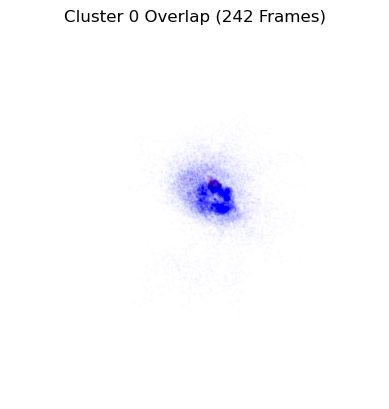

Aligning frames: 100%|████████████████████████| 275/275 [00:03<00:00, 88.91it/s]


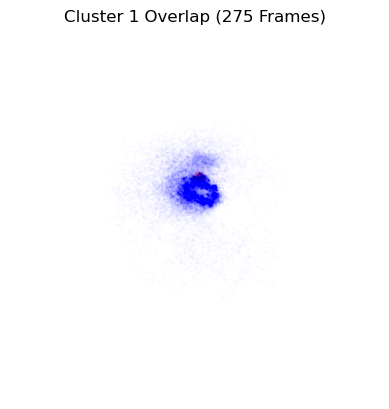

Aligning frames: 100%|███████████████████████| 312/312 [00:01<00:00, 174.86it/s]


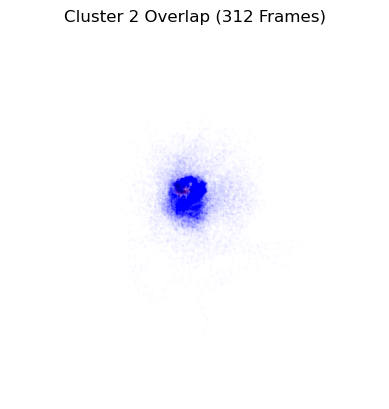

Aligning frames: 100%|███████████████████████| 332/332 [00:01<00:00, 192.80it/s]


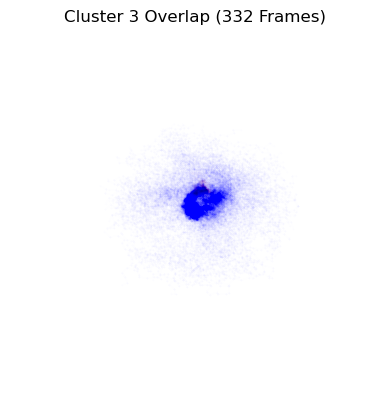

Aligning frames: 100%|███████████████████████| 362/362 [00:01<00:00, 196.95it/s]


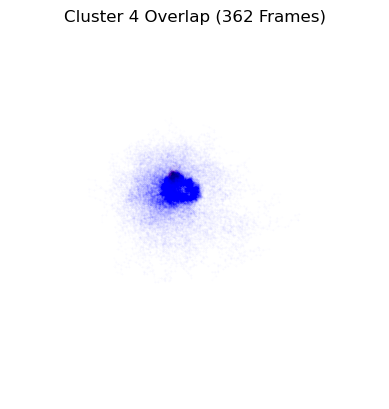

Aligning frames: 100%|███████████████████████| 175/175 [00:00<00:00, 190.38it/s]


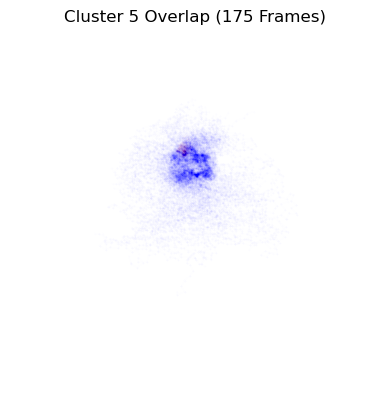

Aligning frames: 100%|████████████████████████| 207/207 [00:02<00:00, 98.79it/s]


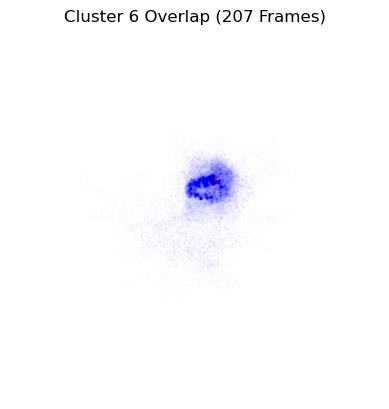

Aligning frames: 100%|█████████████████████████| 98/98 [00:00<00:00, 195.20it/s]


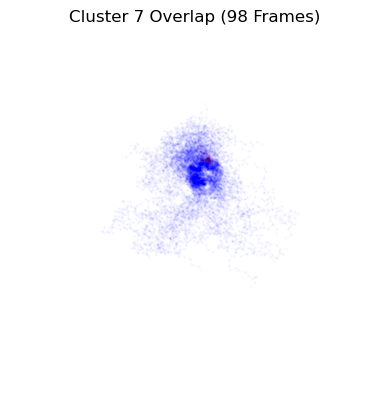

Aligning frames: 100%|███████████████████████| 204/204 [00:01<00:00, 124.15it/s]


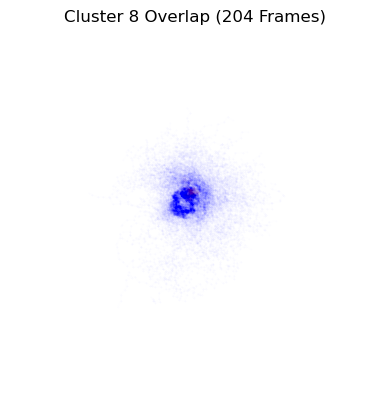

Aligning frames: 100%|███████████████████████| 203/203 [00:01<00:00, 197.12it/s]


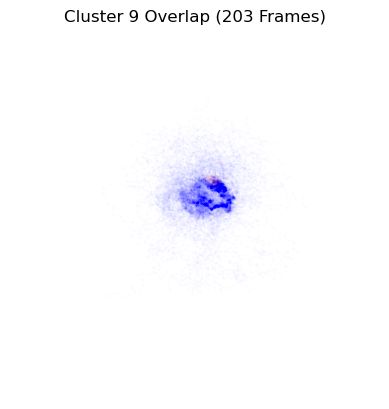

Aligning frames: 100%|██████████████████████████| 70/70 [00:01<00:00, 46.92it/s]


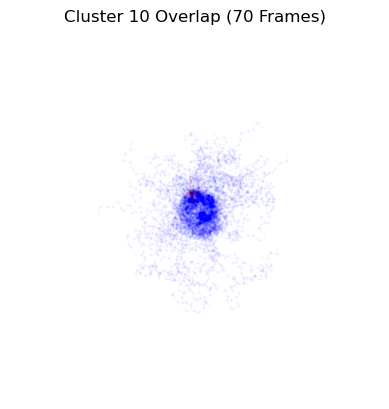

Aligning frames: 100%|███████████████████████| 439/439 [00:02<00:00, 163.87it/s]


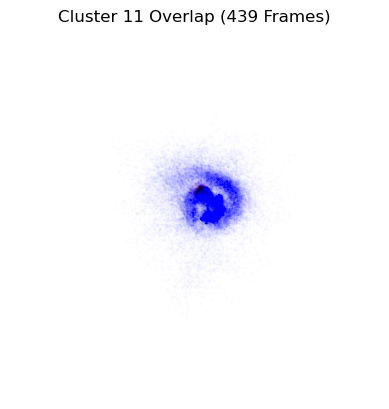

Aligning frames: 100%|███████████████████████| 185/185 [00:00<00:00, 187.37it/s]


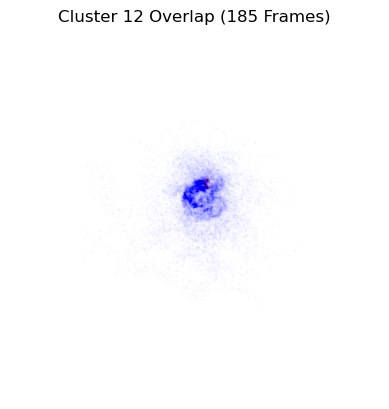

Aligning frames: 100%|████████████████████████| 196/196 [00:02<00:00, 97.49it/s]


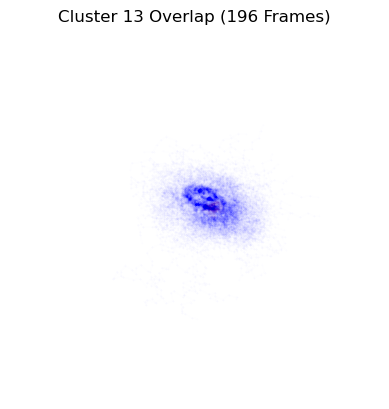

Aligning frames: 100%|███████████████████████| 155/155 [00:00<00:00, 207.04it/s]


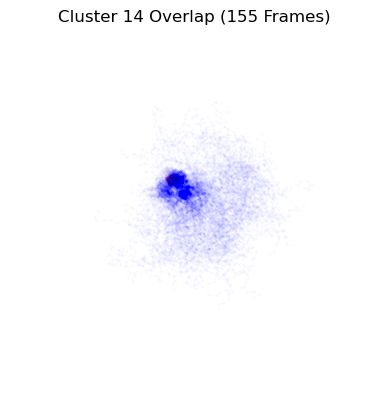

Aligning frames: 100%|████████████████████████| 173/173 [00:01<00:00, 97.98it/s]


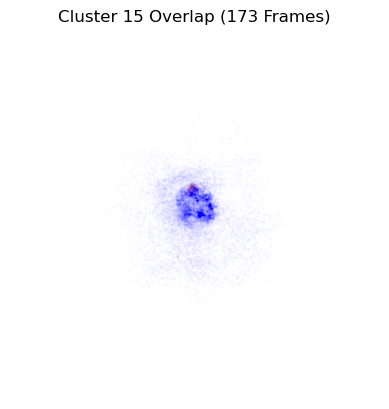

Aligning frames: 100%|███████████████████████| 247/247 [00:02<00:00, 107.23it/s]


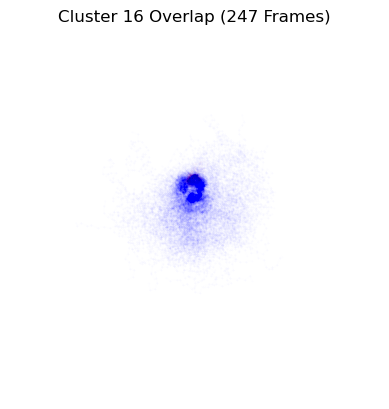

Aligning frames: 100%|███████████████████████| 208/208 [00:01<00:00, 200.60it/s]


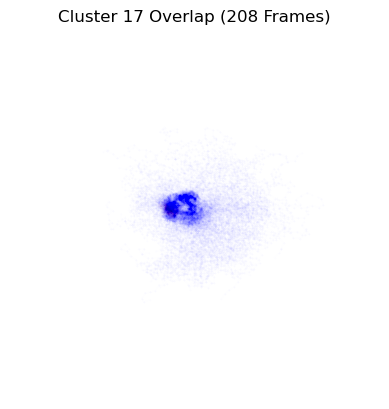

Aligning frames: 100%|████████████████████████| 182/182 [00:02<00:00, 85.02it/s]


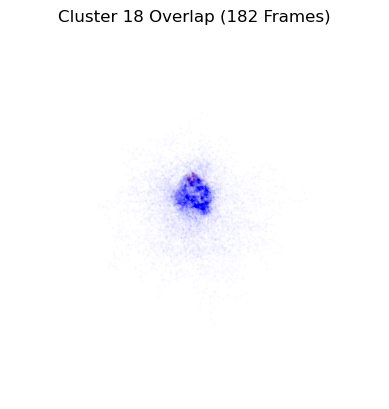

Aligning frames: 100%|████████████████████████| 114/114 [00:01<00:00, 70.29it/s]


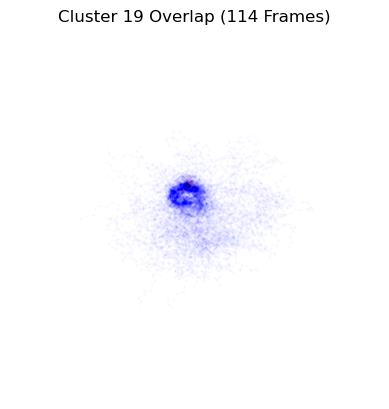

Aligning frames: 100%|███████████████████████| 197/197 [00:01<00:00, 114.84it/s]


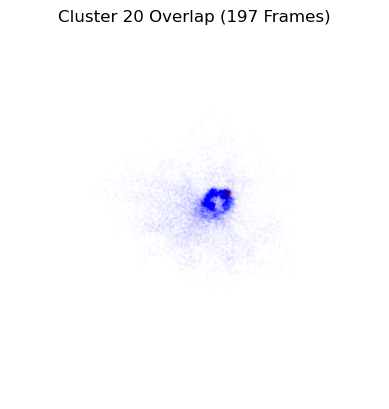

Aligning frames: 100%|███████████████████████| 349/349 [00:01<00:00, 199.98it/s]


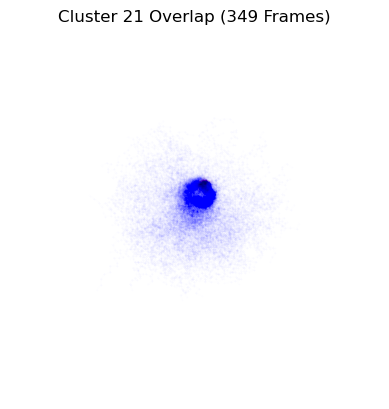

Aligning frames: 100%|████████████████████████| 375/375 [00:03<00:00, 98.88it/s]


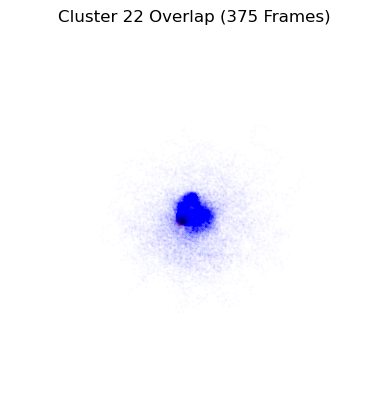

Aligning frames: 100%|████████████████████████| 146/146 [00:02<00:00, 55.21it/s]


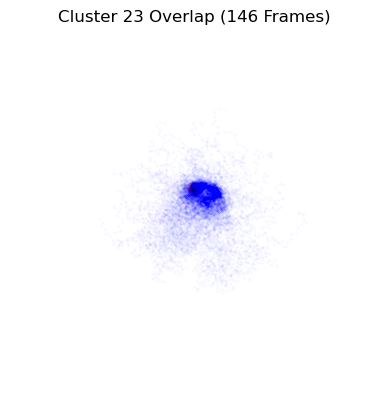

Aligning frames: 100%|███████████████████████| 325/325 [00:01<00:00, 194.69it/s]


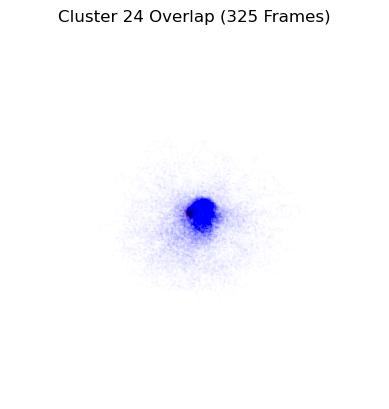

Aligning frames: 100%|███████████████████████| 508/508 [00:02<00:00, 195.17it/s]


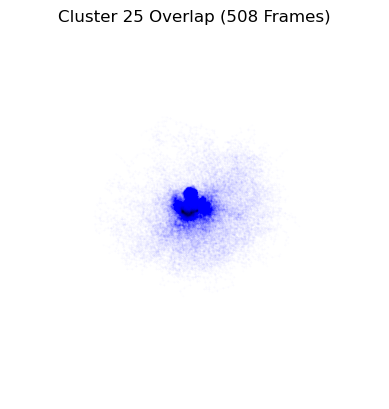

Aligning frames: 100%|███████████████████████| 480/480 [00:02<00:00, 192.72it/s]


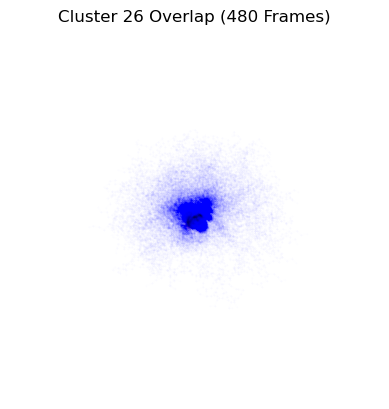

Aligning frames: 100%|███████████████████████| 377/377 [00:01<00:00, 191.52it/s]


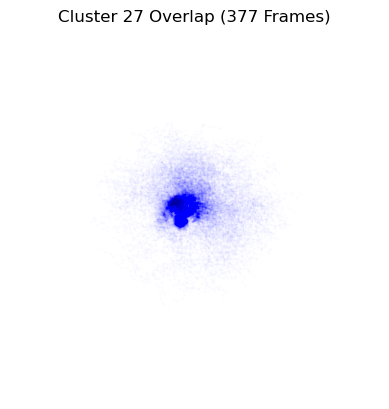

Aligning frames: 100%|████████████████████████| 323/323 [00:03<00:00, 86.93it/s]


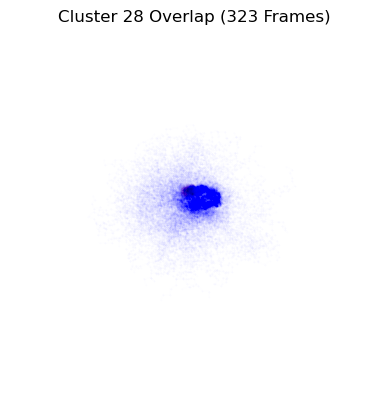

Aligning frames: 100%|███████████████████████| 419/419 [00:02<00:00, 190.75it/s]


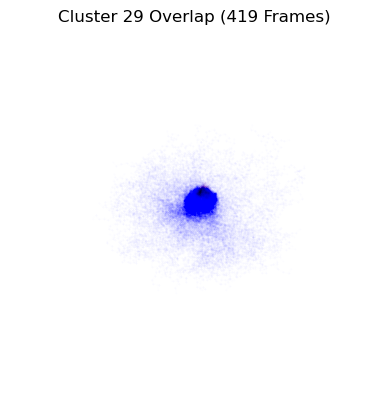

Aligning frames: 100%|████████████████████████| 287/287 [00:04<00:00, 64.38it/s]


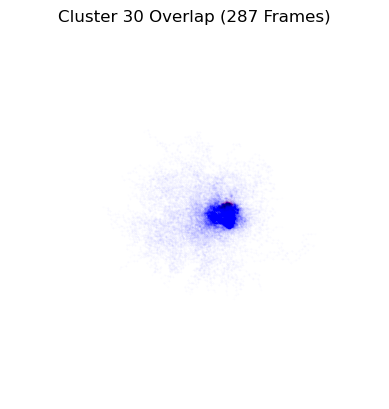

Aligning frames: 100%|████████████████████████| 222/222 [00:02<00:00, 78.74it/s]


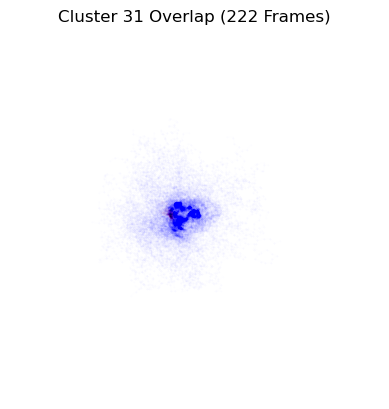

Aligning frames: 100%|████████████████████████| 303/303 [00:03<00:00, 86.75it/s]


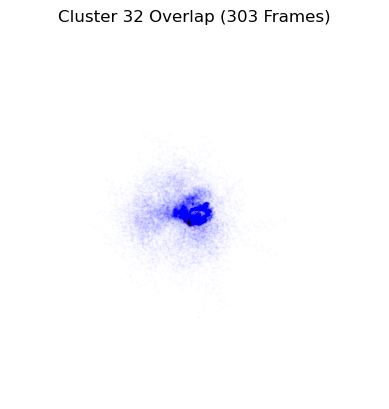

Aligning frames: 100%|████████████████████████| 277/277 [00:03<00:00, 82.58it/s]


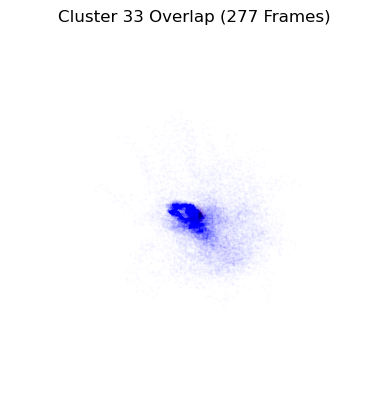

Aligning frames: 100%|███████████████████████| 158/158 [00:00<00:00, 180.40it/s]


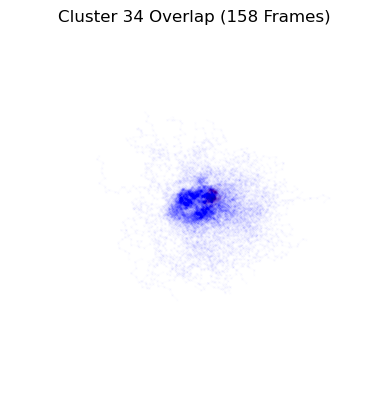

Aligning frames: 100%|███████████████████████| 541/541 [00:02<00:00, 201.86it/s]


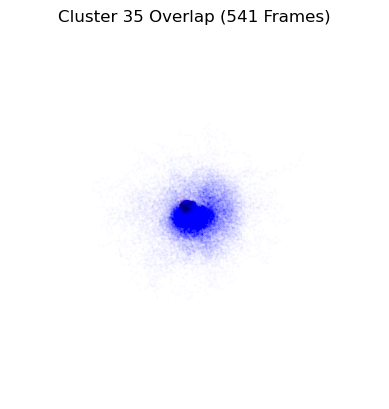

Aligning frames: 100%|███████████████████████| 280/280 [00:01<00:00, 192.95it/s]


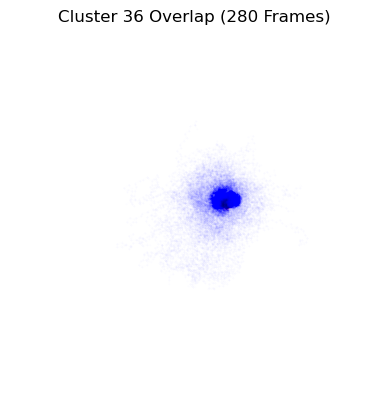

Aligning frames: 100%|████████████████████████| 316/316 [00:03<00:00, 99.20it/s]


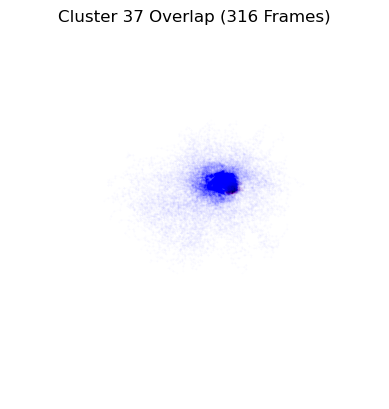

Aligning frames: 100%|███████████████████████| 503/503 [00:02<00:00, 197.41it/s]


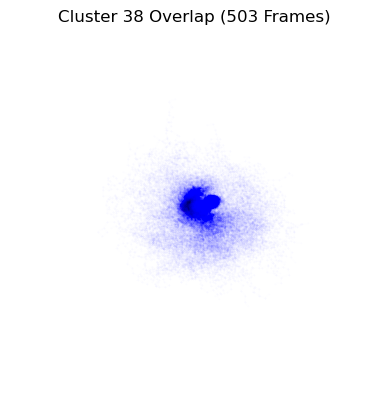

Aligning frames: 100%|████████████████████████| 307/307 [00:04<00:00, 75.87it/s]


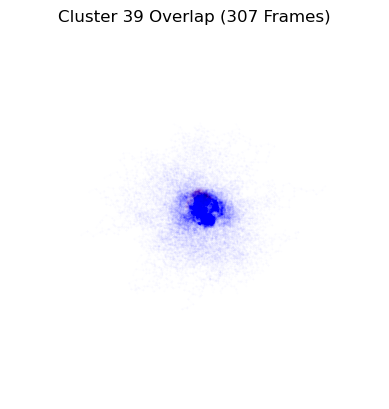

Aligning frames: 100%|████████████████████████| 141/141 [00:02<00:00, 60.16it/s]


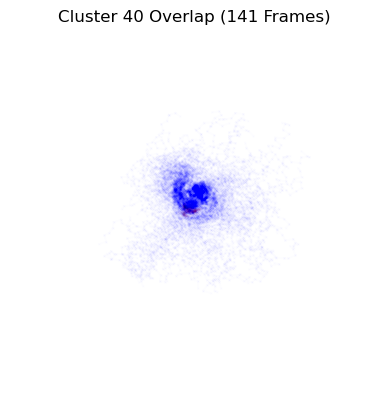

Aligning frames: 100%|███████████████████████| 765/765 [00:03<00:00, 200.18it/s]


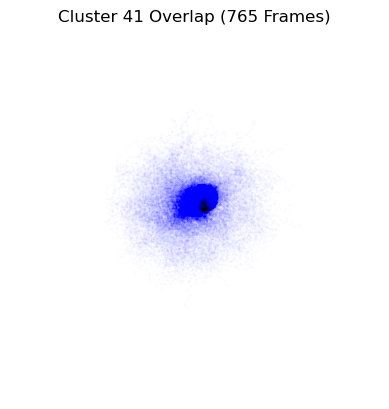

Aligning frames: 100%|████████████████████████| 358/358 [00:05<00:00, 64.92it/s]


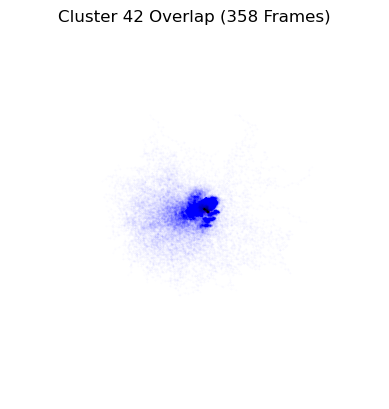

Aligning frames: 100%|███████████████████████| 272/272 [00:01<00:00, 191.26it/s]


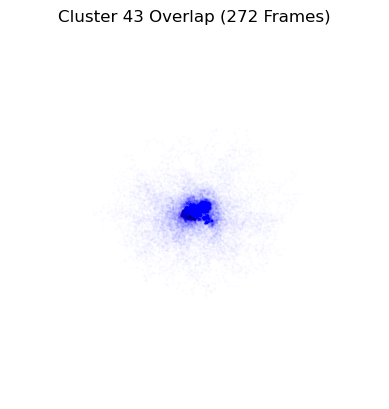

Aligning frames: 100%|███████████████████████| 351/351 [00:01<00:00, 194.05it/s]


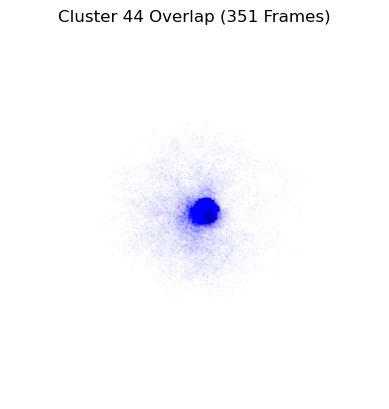

Aligning frames: 100%|████████████████████████| 383/383 [00:03<00:00, 99.38it/s]


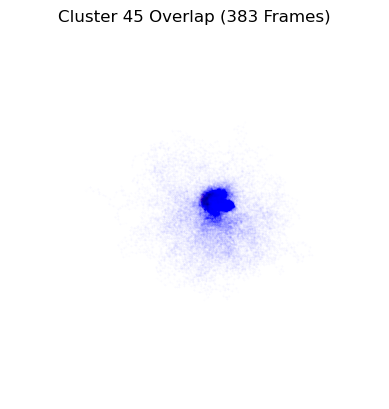

Aligning frames: 100%|████████████████████████| 224/224 [00:03<00:00, 70.96it/s]


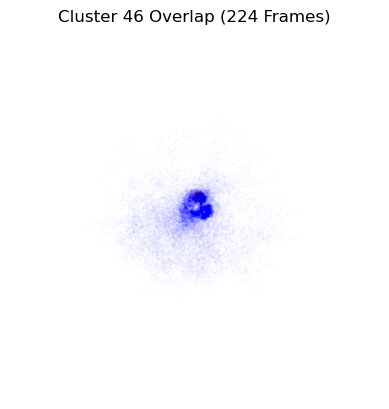

Aligning frames: 100%|███████████████████████| 536/536 [00:02<00:00, 200.21it/s]


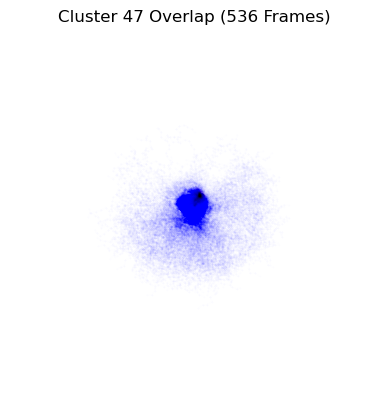

Aligning frames: 100%|███████████████████████| 207/207 [00:01<00:00, 171.99it/s]


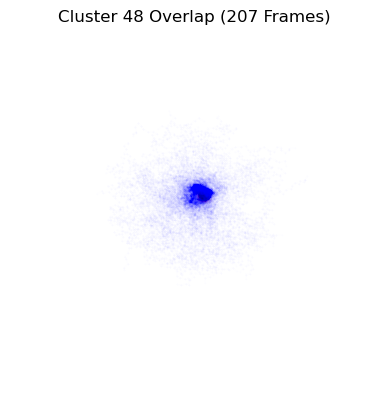

Aligning frames: 100%|███████████████████████| 174/174 [00:00<00:00, 192.34it/s]


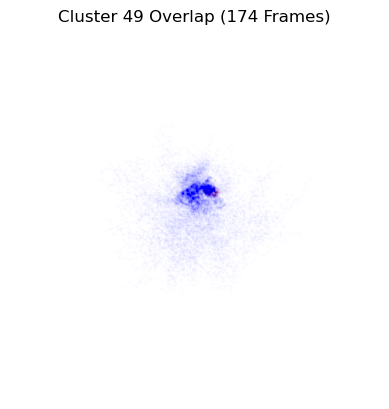

Aligning frames: 100%|███████████████████████| 368/368 [00:01<00:00, 197.63it/s]


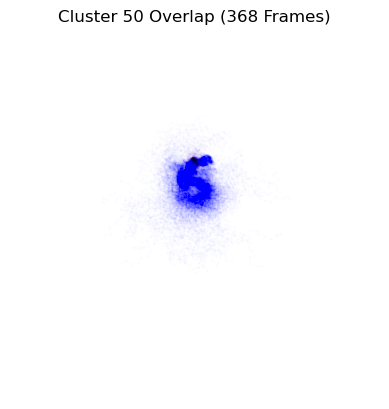

Aligning frames: 100%|███████████████████████| 280/280 [00:01<00:00, 193.16it/s]


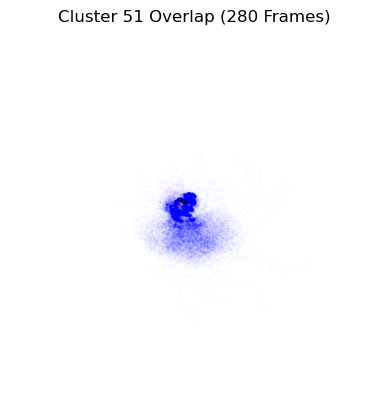

Aligning frames: 100%|███████████████████████| 210/210 [00:01<00:00, 189.72it/s]


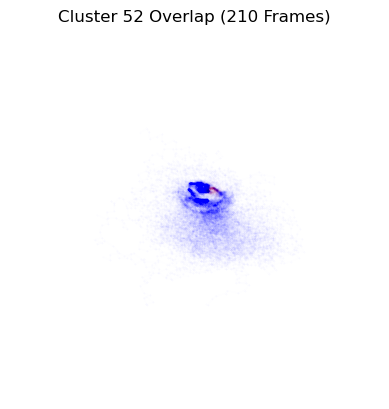

Aligning frames: 100%|███████████████████████| 157/157 [00:00<00:00, 190.17it/s]


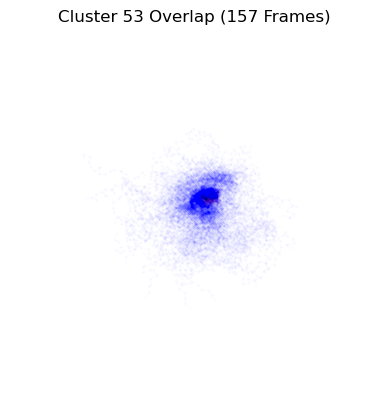

Aligning frames: 100%|████████████████████████| 176/176 [00:01<00:00, 96.90it/s]


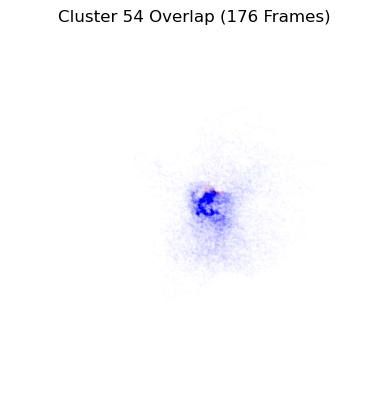

Aligning frames: 100%|███████████████████████| 246/246 [00:02<00:00, 103.77it/s]


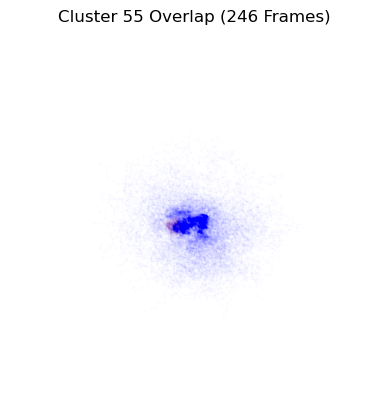

Aligning frames: 100%|███████████████████████| 314/314 [00:01<00:00, 195.75it/s]


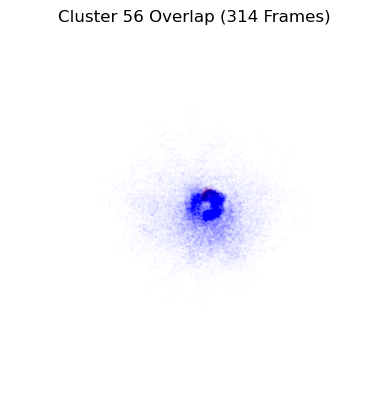

Aligning frames: 100%|███████████████████████| 372/372 [00:03<00:00, 105.58it/s]


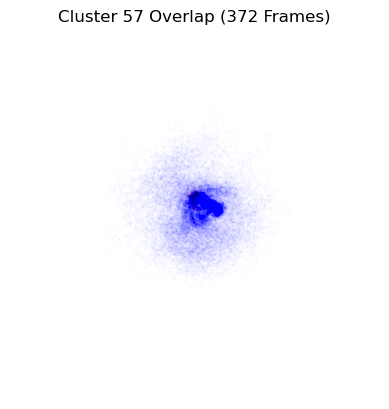

Aligning frames: 100%|████████████████████████| 198/198 [00:02<00:00, 67.07it/s]


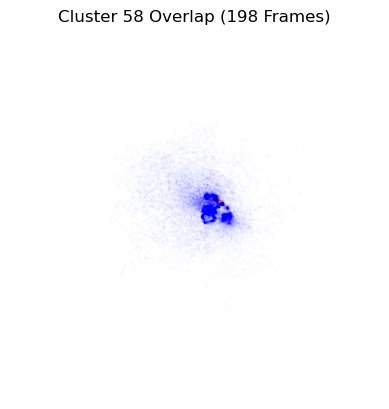

Aligning frames: 100%|█████████████████████████| 92/92 [00:00<00:00, 182.34it/s]


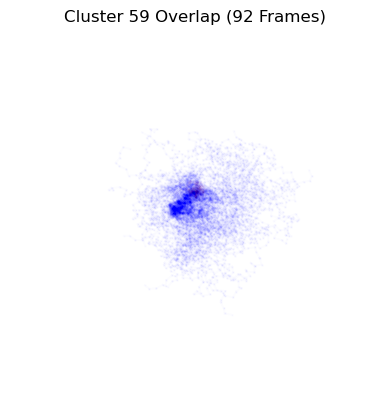

Aligning frames: 100%|███████████████████████| 306/306 [00:01<00:00, 197.74it/s]


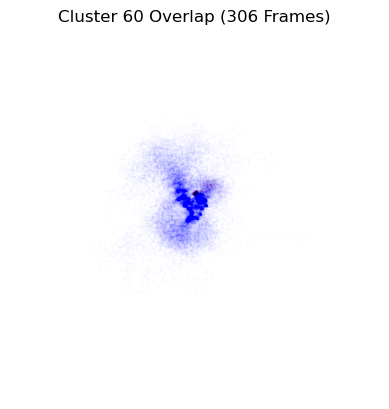

Aligning frames: 100%|███████████████████████| 284/284 [00:01<00:00, 191.41it/s]


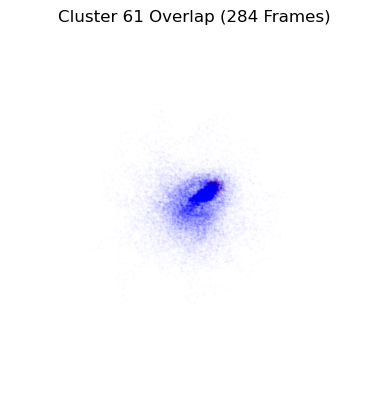

Aligning frames: 100%|███████████████████████| 484/484 [00:02<00:00, 197.81it/s]


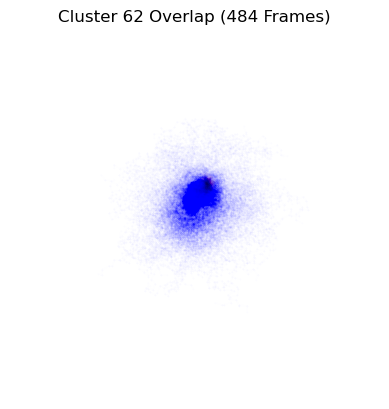

Aligning frames: 100%|████████████████████████| 285/285 [00:03<00:00, 73.75it/s]


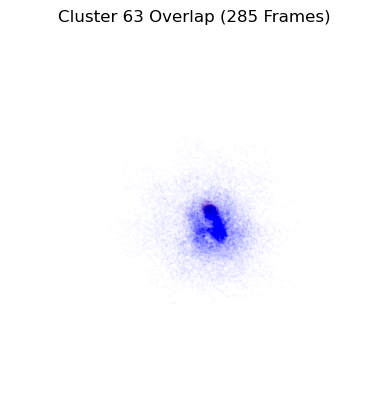

Aligning frames: 100%|████████████████████████| 289/289 [00:02<00:00, 97.03it/s]


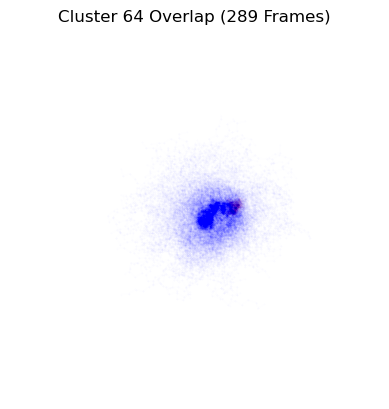

Aligning frames: 100%|████████████████████████| 143/143 [00:02<00:00, 63.22it/s]


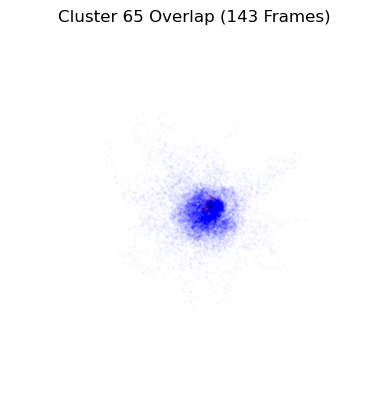

Aligning frames: 100%|███████████████████████| 323/323 [00:01<00:00, 200.05it/s]


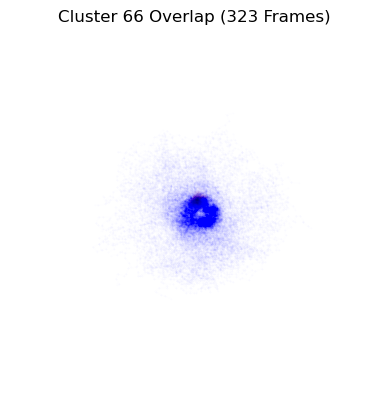

Aligning frames: 100%|███████████████████████| 424/424 [00:02<00:00, 197.51it/s]


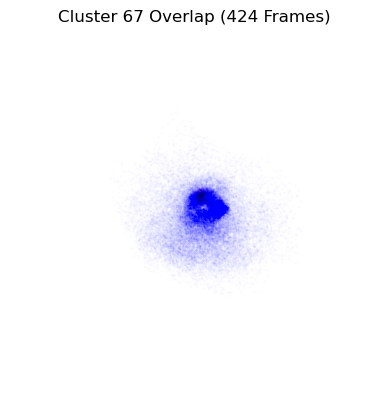

Aligning frames: 100%|████████████████████████| 176/176 [00:02<00:00, 58.82it/s]


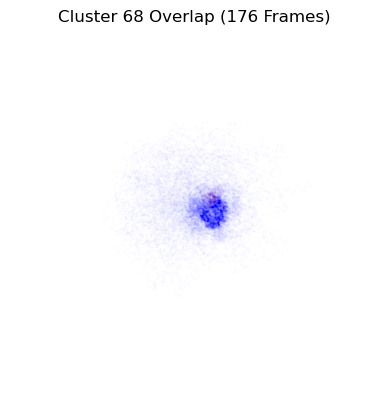

Aligning frames: 100%|███████████████████████| 360/360 [00:01<00:00, 200.08it/s]


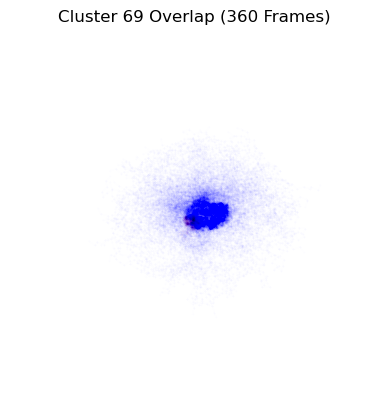

Aligning frames: 100%|███████████████████████| 480/480 [00:04<00:00, 111.98it/s]


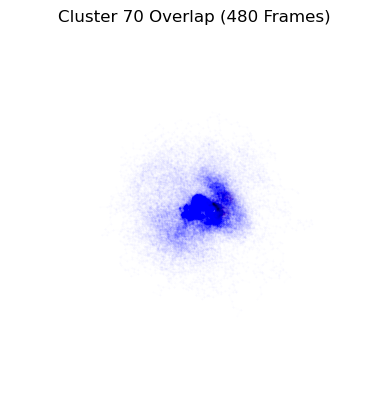

Aligning frames: 100%|███████████████████████| 709/709 [00:06<00:00, 116.20it/s]


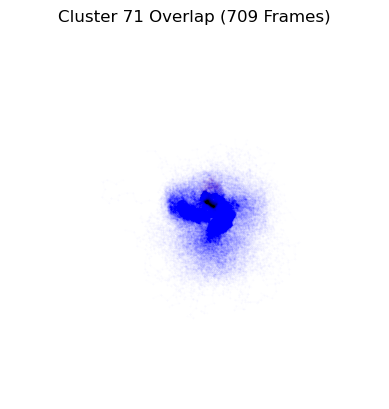

Aligning frames: 100%|████████████████████████| 393/393 [00:05<00:00, 70.92it/s]


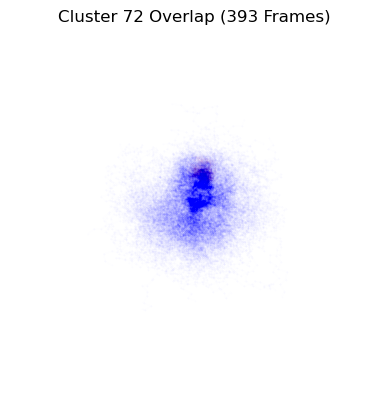

Aligning frames: 100%|███████████████████████| 589/589 [00:05<00:00, 111.50it/s]


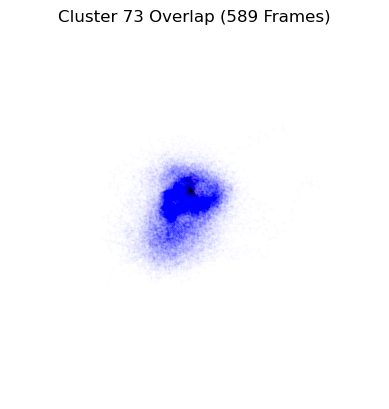

Aligning frames: 100%|████████████████████████| 481/481 [00:05<00:00, 90.29it/s]


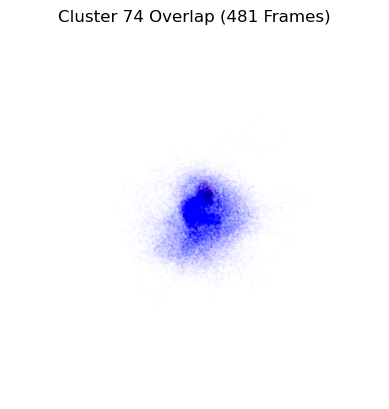

Aligning frames: 100%|████████████████████████| 277/277 [00:03<00:00, 71.64it/s]


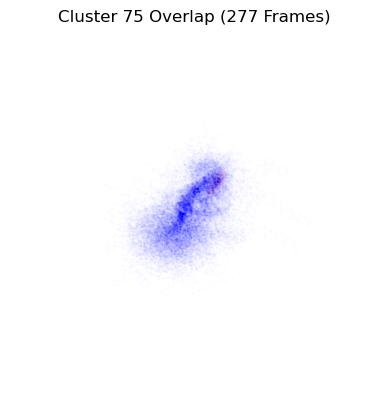

Aligning frames: 100%|███████████████████████| 256/256 [00:01<00:00, 191.61it/s]


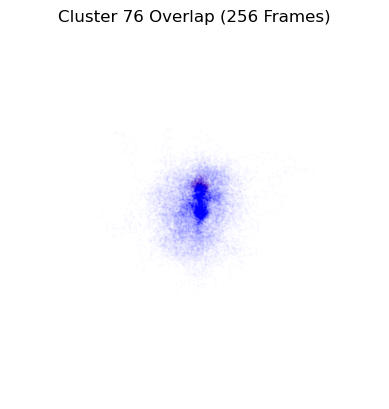

Aligning frames: 100%|███████████████████████| 355/355 [00:03<00:00, 109.74it/s]


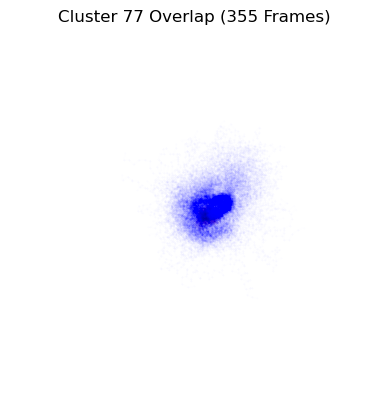

Aligning frames: 100%|███████████████████████| 256/256 [00:01<00:00, 185.24it/s]


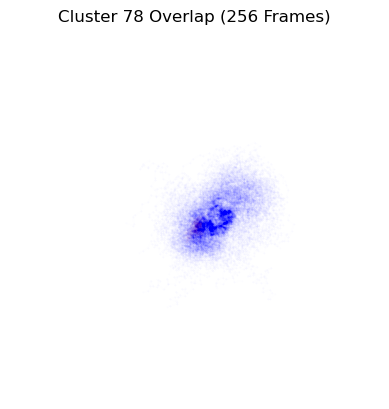

Aligning frames: 100%|███████████████████████| 149/149 [00:00<00:00, 185.24it/s]


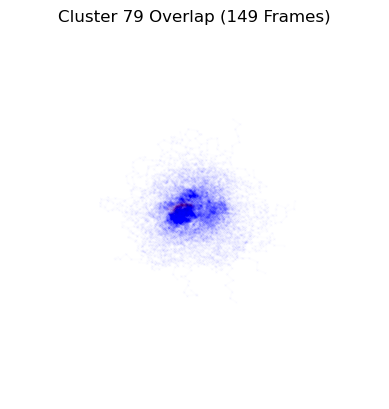

Aligning frames: 100%|███████████████████████| 187/187 [00:01<00:00, 186.23it/s]


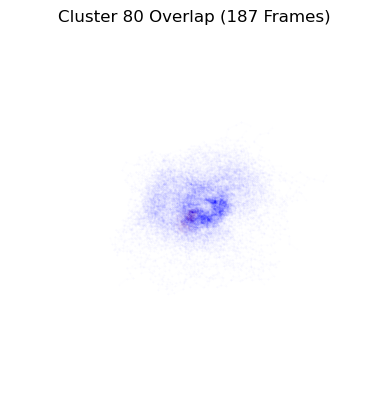

Aligning frames: 100%|████████████████████████| 124/124 [00:01<00:00, 72.84it/s]


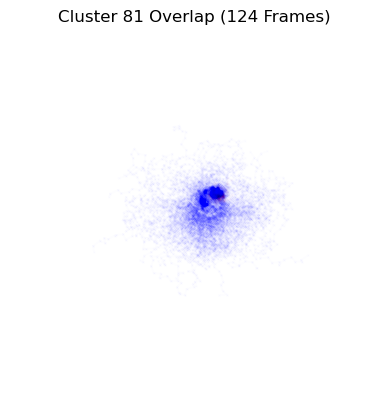

Aligning frames: 100%|███████████████████████| 331/331 [00:02<00:00, 135.61it/s]


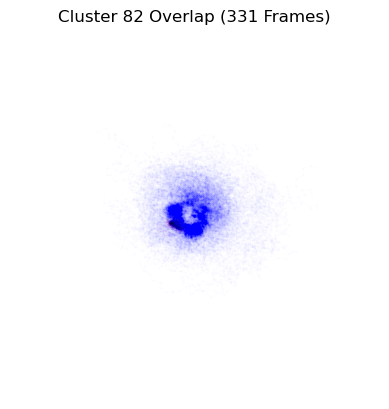

Aligning frames: 100%|███████████████████████| 430/430 [00:02<00:00, 196.94it/s]


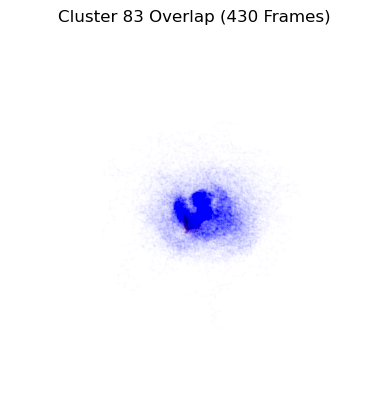

Aligning frames: 100%|███████████████████████| 715/715 [00:03<00:00, 195.83it/s]


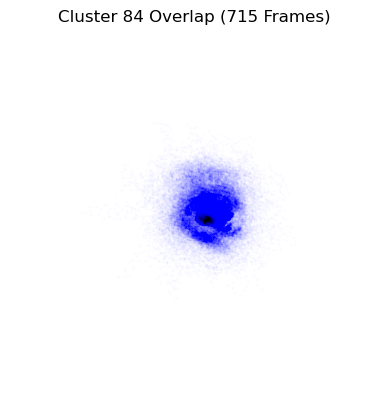

Aligning frames: 100%|███████████████████████| 471/471 [00:02<00:00, 191.07it/s]


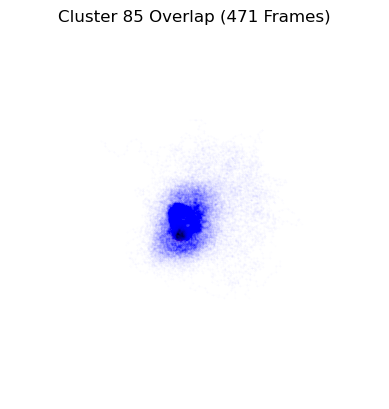

Aligning frames: 100%|████████████████████████| 417/417 [00:04<00:00, 92.14it/s]


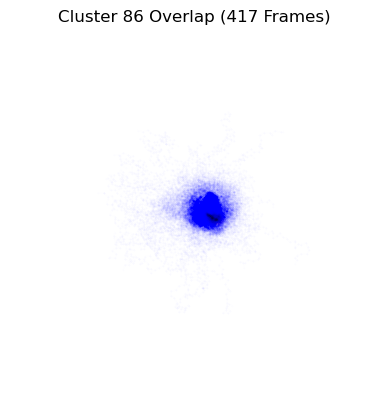

Aligning frames: 100%|███████████████████████| 465/465 [00:02<00:00, 193.64it/s]


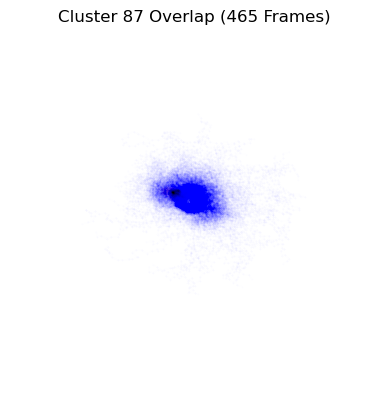

Aligning frames: 100%|███████████████████████| 391/391 [00:02<00:00, 179.21it/s]


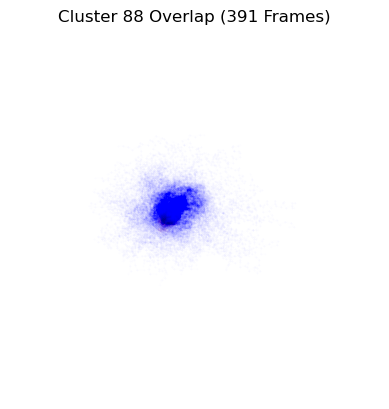

Aligning frames: 100%|████████████████████████| 184/184 [00:03<00:00, 59.79it/s]


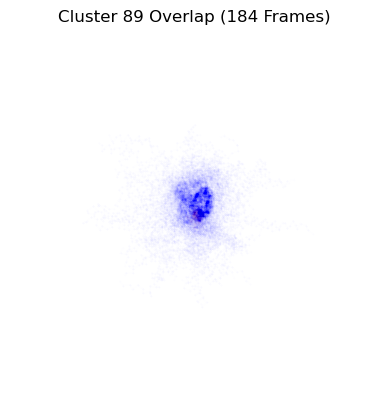

Aligning frames: 100%|███████████████████████| 229/229 [00:01<00:00, 201.94it/s]


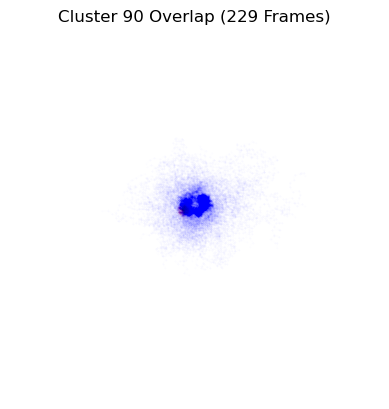

Aligning frames: 100%|███████████████████████| 476/476 [00:02<00:00, 197.37it/s]


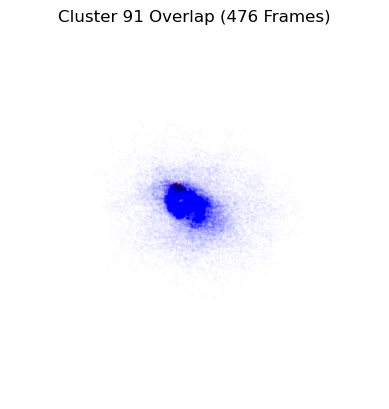

Aligning frames: 100%|███████████████████████| 580/580 [00:02<00:00, 200.16it/s]


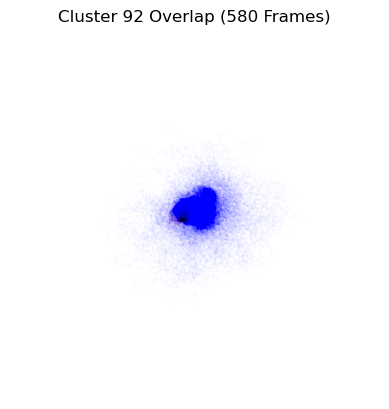

Aligning frames: 100%|███████████████████████| 520/520 [00:02<00:00, 191.41it/s]


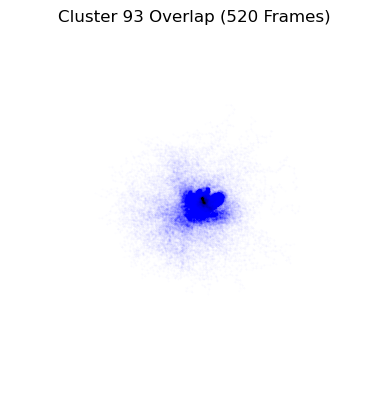

Aligning frames: 100%|████████████████████████| 549/549 [00:05<00:00, 98.51it/s]


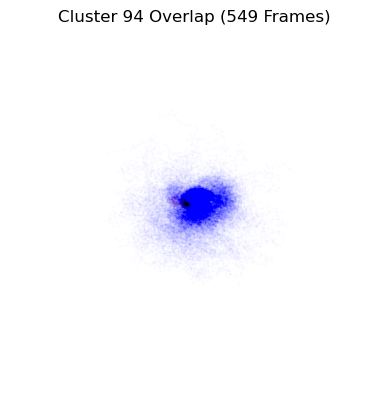

Aligning frames: 100%|███████████████████████| 349/349 [00:01<00:00, 191.62it/s]


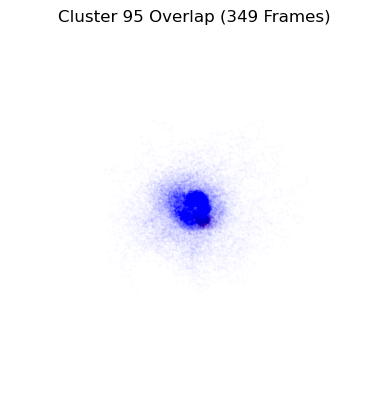

Aligning frames: 100%|███████████████████████| 476/476 [00:04<00:00, 111.45it/s]


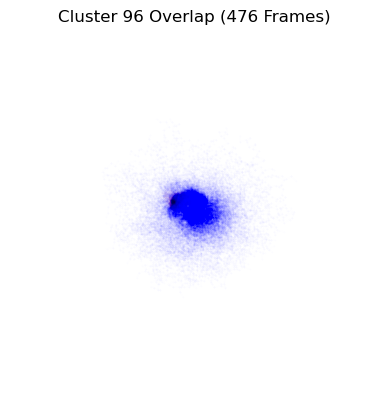

Aligning frames: 100%|████████████████████████| 207/207 [00:03<00:00, 59.51it/s]


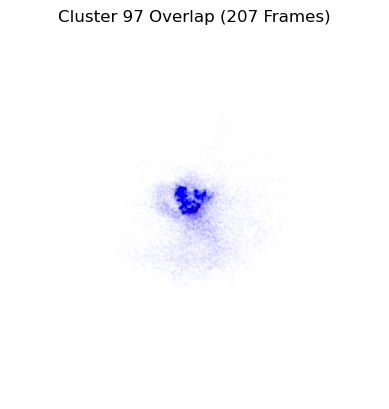

Aligning frames: 100%|███████████████████████| 424/424 [00:03<00:00, 128.04it/s]


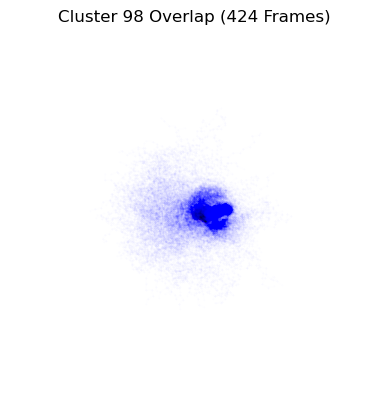

Aligning frames: 100%|████████████████████████| 393/393 [00:04<00:00, 93.55it/s]


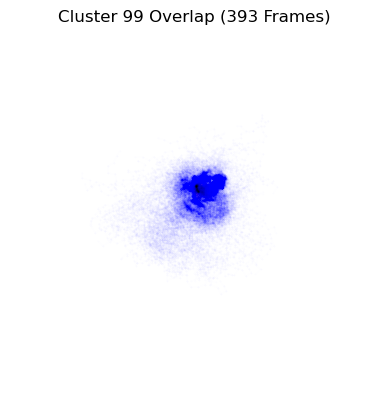

Aligning frames: 100%|███████████████████████| 432/432 [00:04<00:00, 100.71it/s]


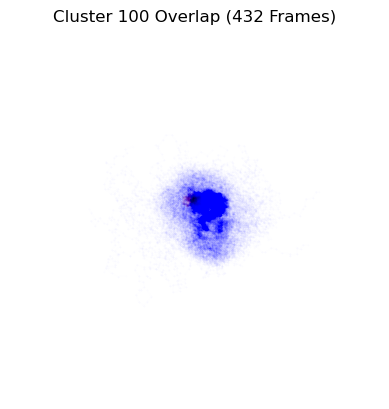

Aligning frames: 100%|███████████████████████| 134/134 [00:00<00:00, 182.46it/s]


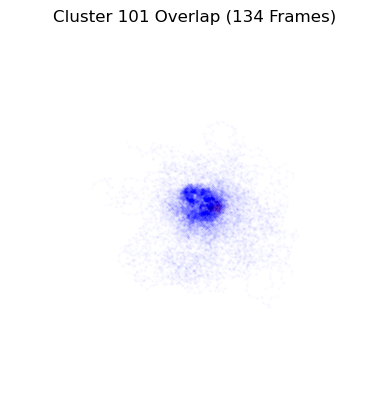

Aligning frames: 100%|███████████████████████| 436/436 [00:03<00:00, 141.21it/s]


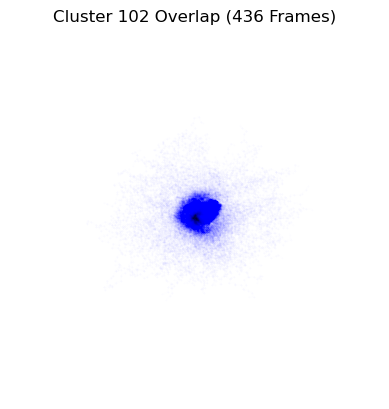

Aligning frames: 100%|███████████████████████| 574/574 [00:05<00:00, 108.83it/s]


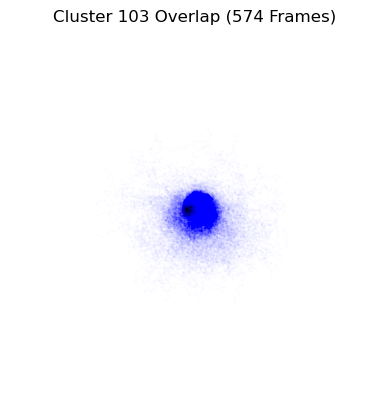

Aligning frames: 100%|███████████████████████| 724/724 [00:06<00:00, 112.24it/s]


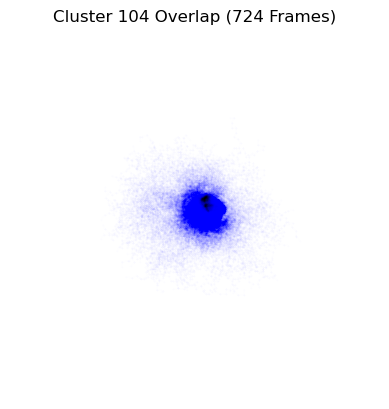

Aligning frames: 100%|███████████████████████| 772/772 [00:03<00:00, 200.04it/s]


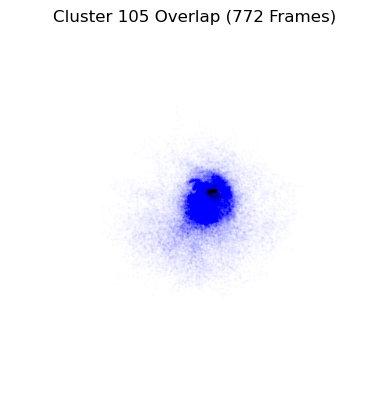

Aligning frames: 100%|███████████████████████| 598/598 [00:03<00:00, 197.61it/s]


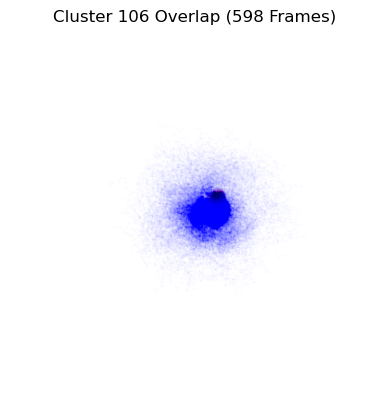

Aligning frames: 100%|███████████████████████| 741/741 [00:06<00:00, 107.86it/s]


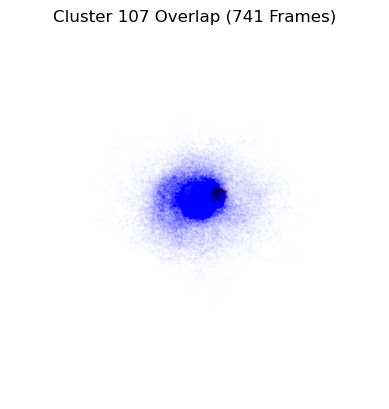

Aligning frames: 100%|████████████████████████| 463/463 [00:06<00:00, 76.76it/s]


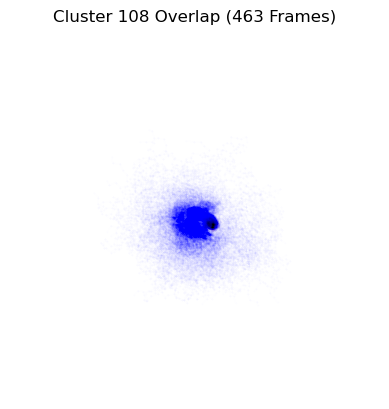

Aligning frames: 100%|███████████████████████| 687/687 [00:05<00:00, 117.52it/s]


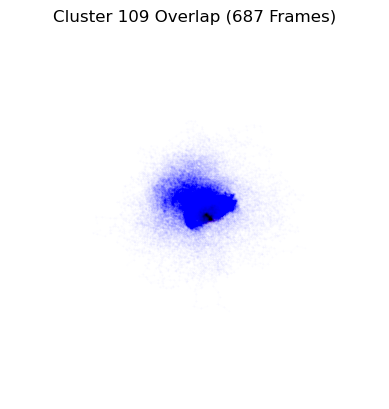

Aligning frames: 100%|███████████████████████| 337/337 [00:01<00:00, 186.60it/s]


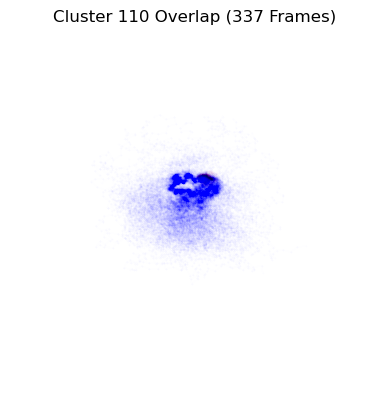

Aligning frames: 100%|███████████████████████| 386/386 [00:03<00:00, 102.57it/s]


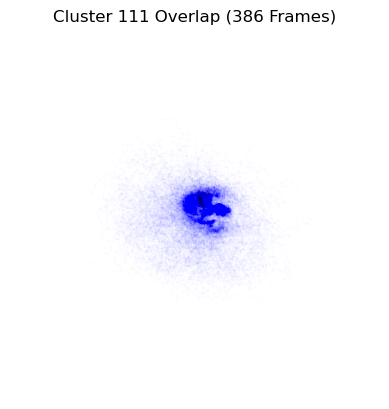

Aligning frames: 100%|███████████████████████| 310/310 [00:01<00:00, 190.62it/s]


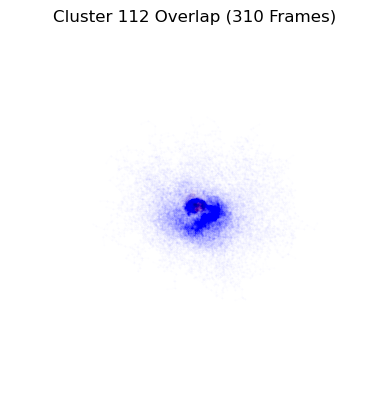

Aligning frames: 100%|███████████████████████| 332/332 [00:01<00:00, 191.22it/s]


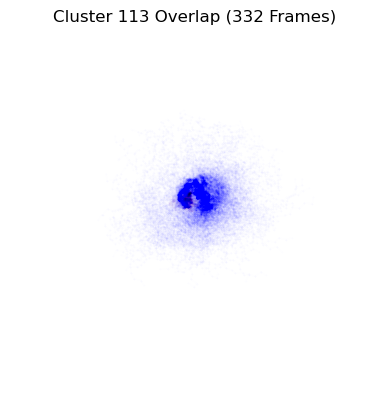

Aligning frames: 100%|███████████████████████| 295/295 [00:01<00:00, 190.10it/s]


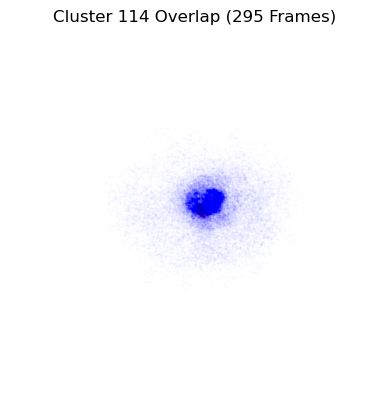

Aligning frames: 100%|███████████████████████| 318/318 [00:03<00:00, 100.24it/s]


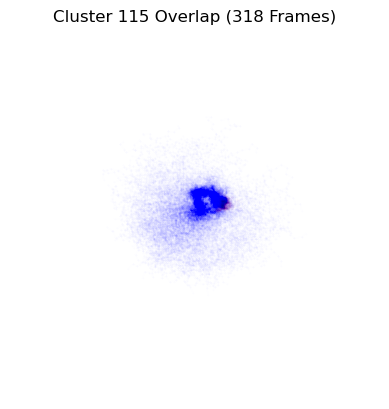

Aligning frames: 100%|███████████████████████| 453/453 [00:03<00:00, 113.33it/s]


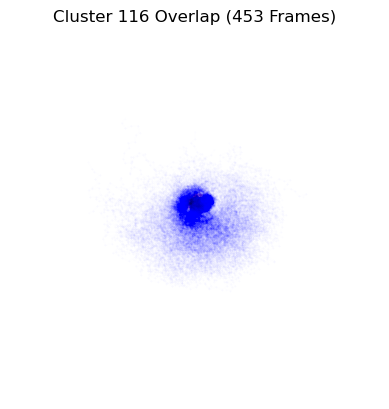

Aligning frames: 100%|███████████████████████| 205/205 [00:01<00:00, 181.91it/s]


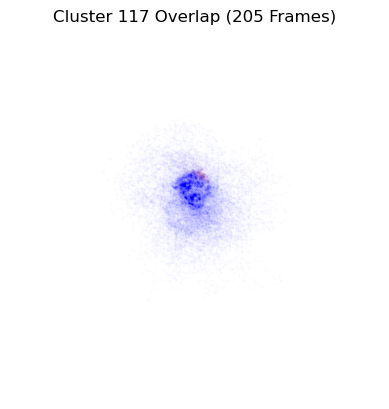

Aligning frames: 100%|████████████████████████| 158/158 [00:01<00:00, 79.44it/s]


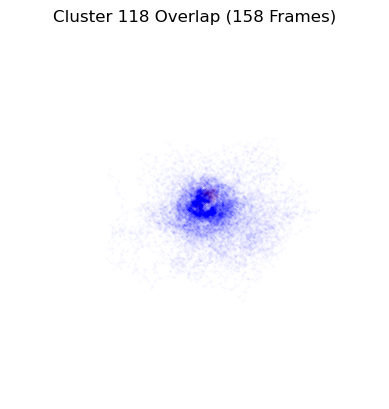

Aligning frames: 100%|███████████████████████| 175/175 [00:00<00:00, 199.44it/s]


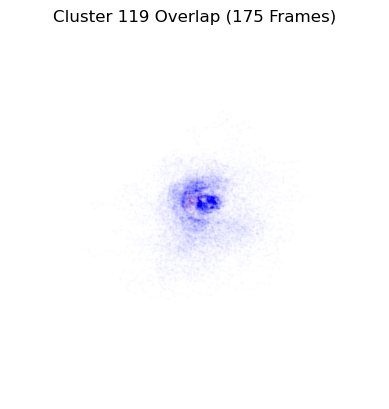

Aligning frames: 100%|███████████████████████| 148/148 [00:00<00:00, 185.15it/s]


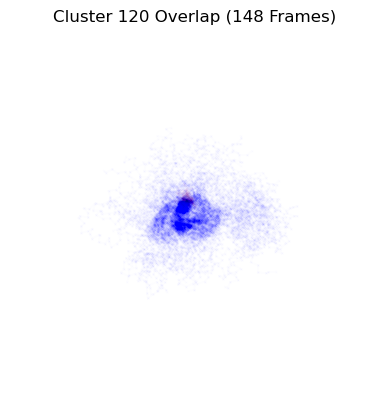

Aligning frames: 100%|███████████████████████| 174/174 [00:00<00:00, 198.93it/s]


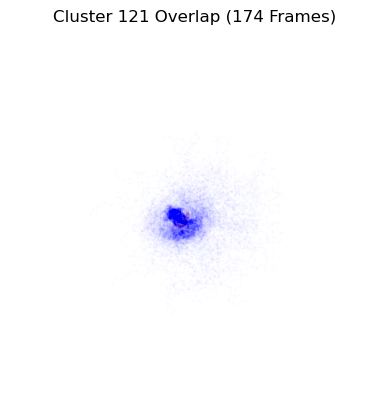

Aligning frames: 100%|███████████████████████| 199/199 [00:01<00:00, 189.95it/s]


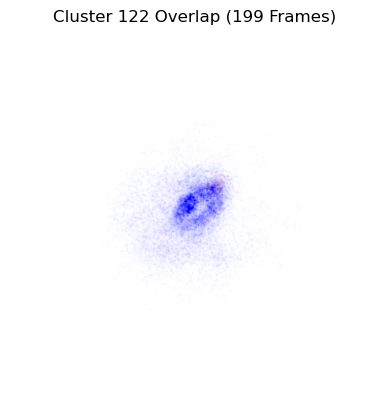

Aligning frames: 100%|████████████████████████| 113/113 [00:01<00:00, 67.08it/s]


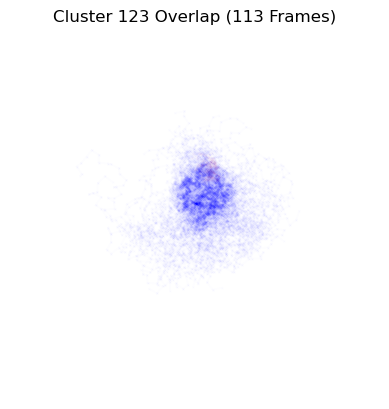

Aligning frames: 100%|███████████████████████| 174/174 [00:01<00:00, 106.70it/s]


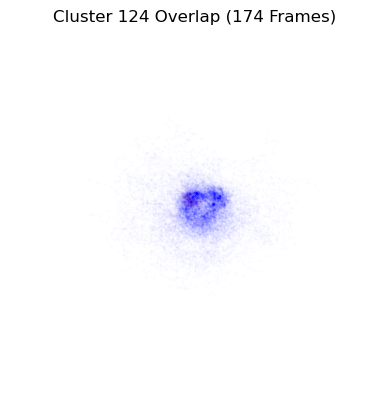

Aligning frames: 100%|███████████████████████| 341/341 [00:02<00:00, 124.13it/s]


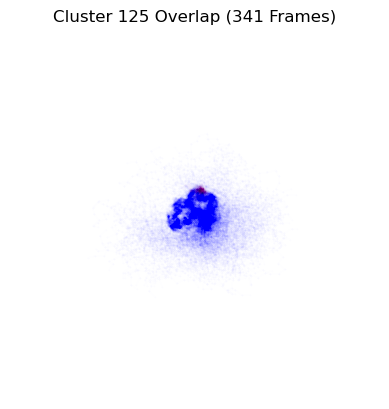

Aligning frames: 100%|███████████████████████| 181/181 [00:01<00:00, 143.15it/s]


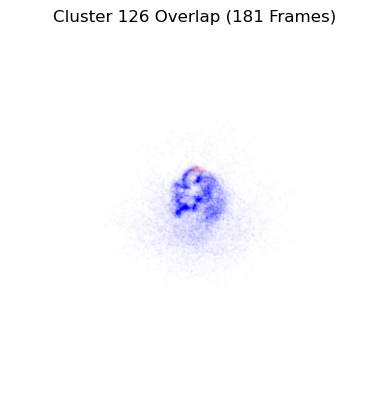

Aligning frames: 100%|███████████████████████| 236/236 [00:01<00:00, 164.14it/s]


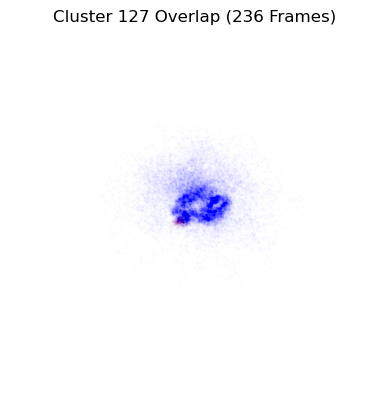

Aligning frames: 100%|███████████████████████| 203/203 [00:01<00:00, 141.09it/s]


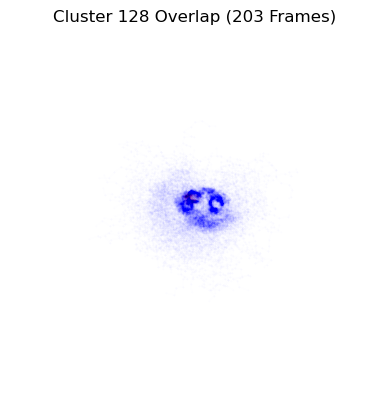

Aligning frames: 100%|███████████████████████| 138/138 [00:01<00:00, 136.58it/s]


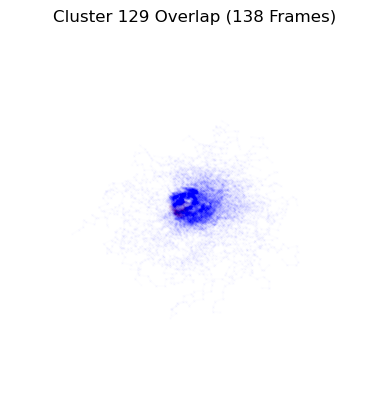

Aligning frames: 100%|███████████████████████| 207/207 [00:01<00:00, 145.26it/s]


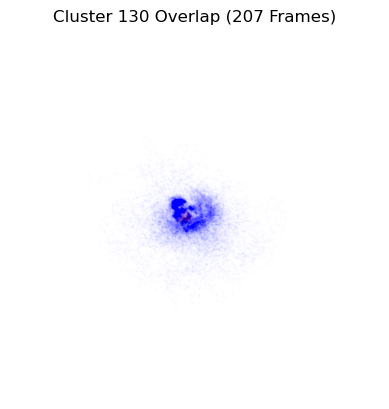

Aligning frames: 100%|███████████████████████| 136/136 [00:01<00:00, 134.06it/s]


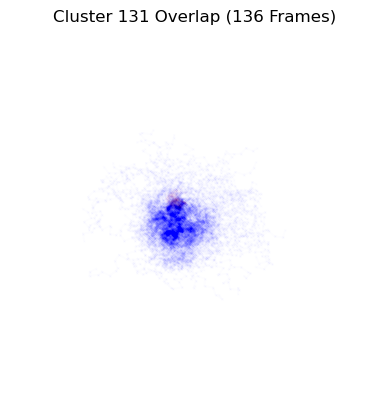

Aligning frames: 100%|███████████████████████| 300/300 [00:02<00:00, 148.49it/s]


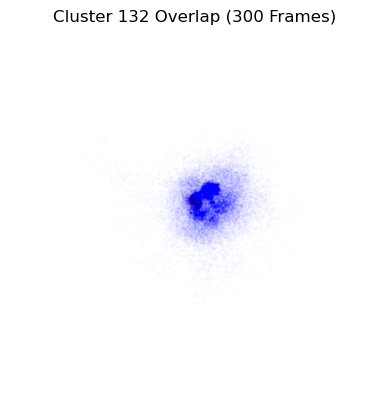

Aligning frames: 100%|███████████████████████| 171/171 [00:00<00:00, 189.75it/s]


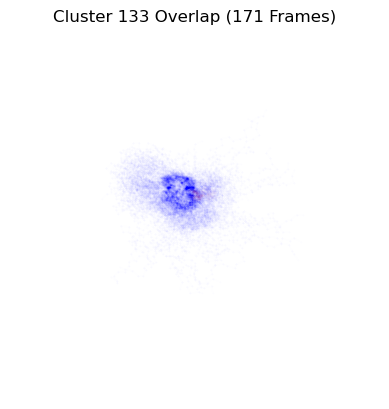

Aligning frames: 100%|███████████████████████| 323/323 [00:02<00:00, 119.87it/s]


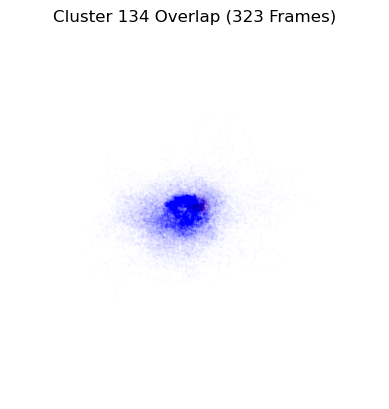

Aligning frames: 100%|████████████████████████| 294/294 [00:03<00:00, 93.99it/s]


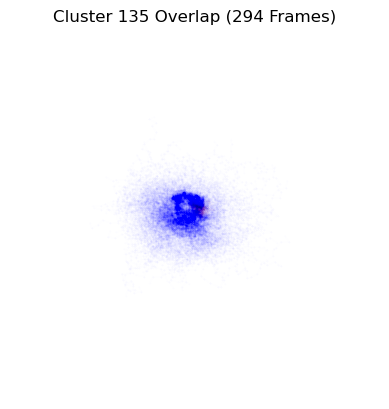

Aligning frames: 100%|███████████████████████| 341/341 [00:03<00:00, 102.96it/s]


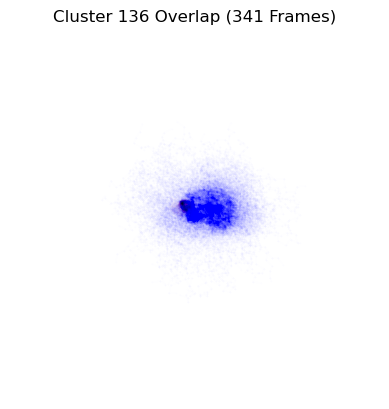

Aligning frames: 100%|███████████████████████| 270/270 [00:01<00:00, 187.28it/s]


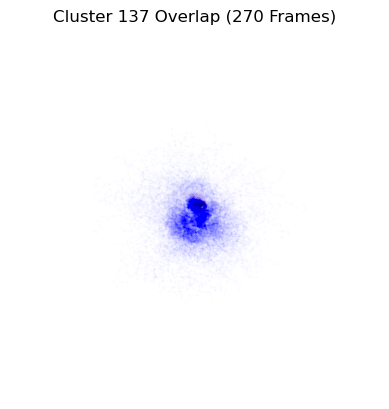

Aligning frames: 100%|████████████████████████| 248/248 [00:02<00:00, 90.30it/s]


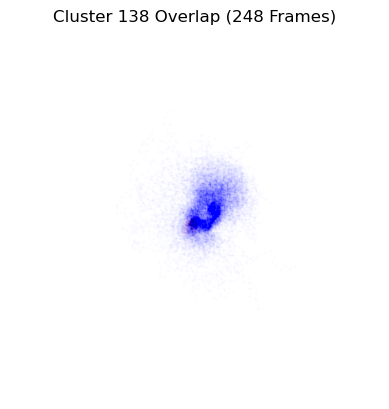

Aligning frames: 100%|███████████████████████| 212/212 [00:01<00:00, 185.59it/s]


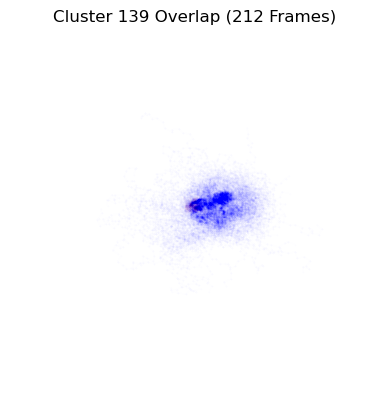

Aligning frames: 100%|████████████████████████| 247/247 [00:02<00:00, 94.46it/s]


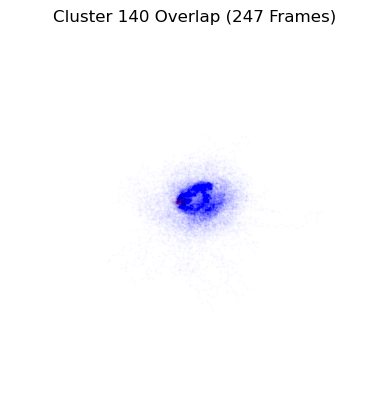

Aligning frames: 100%|███████████████████████| 209/209 [00:01<00:00, 188.03it/s]


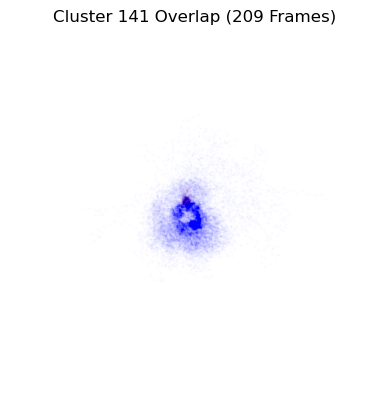

Aligning frames: 100%|████████████████████████| 176/176 [00:02<00:00, 83.20it/s]


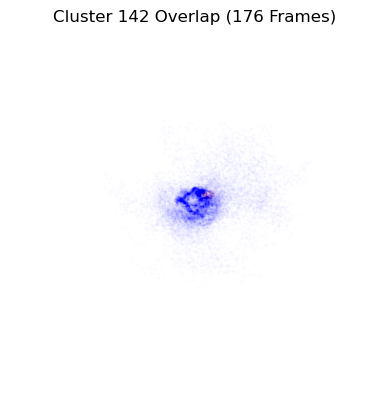

Aligning frames: 100%|███████████████████████| 339/339 [00:02<00:00, 121.30it/s]


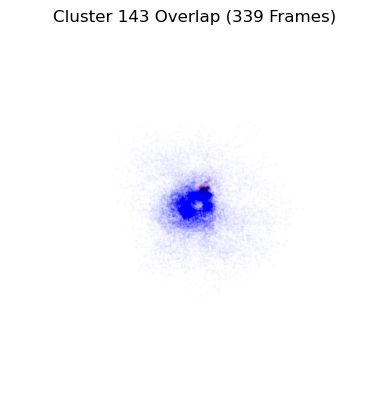

Aligning frames: 100%|███████████████████████| 400/400 [00:02<00:00, 191.97it/s]


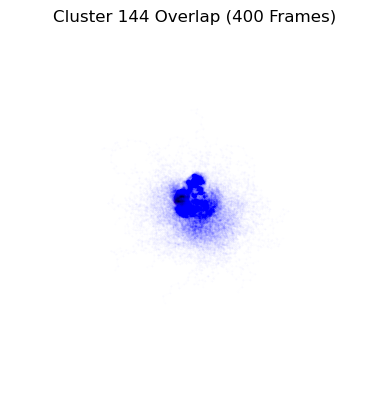

Aligning frames: 100%|███████████████████████| 255/255 [00:01<00:00, 195.91it/s]


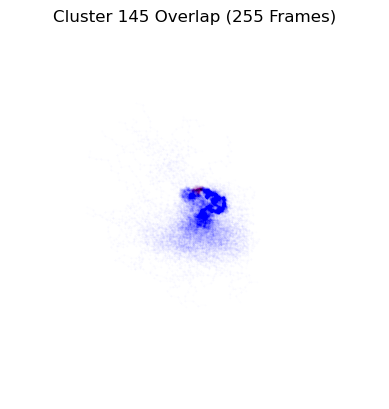

Aligning frames: 100%|████████████████████████| 252/252 [00:02<00:00, 92.44it/s]


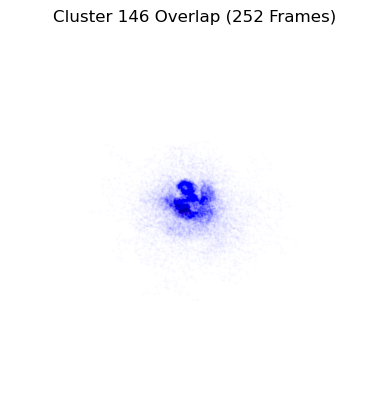

Aligning frames: 100%|███████████████████████| 520/520 [00:02<00:00, 185.07it/s]


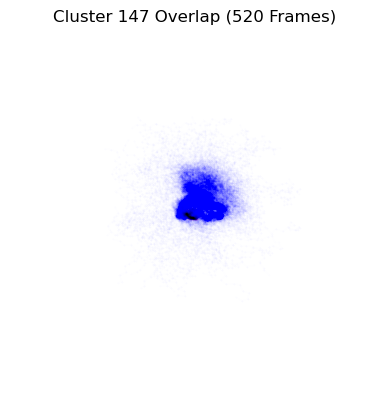

Aligning frames: 100%|███████████████████████| 194/194 [00:01<00:00, 173.44it/s]


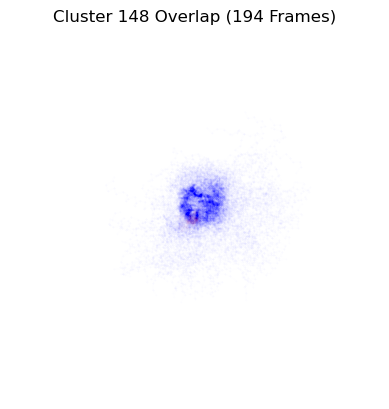

Aligning frames: 100%|████████████████████████| 228/228 [00:02<00:00, 98.06it/s]


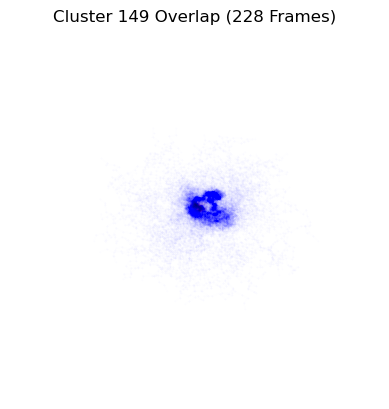

Aligning frames: 100%|████████████████████████| 219/219 [00:02<00:00, 90.62it/s]


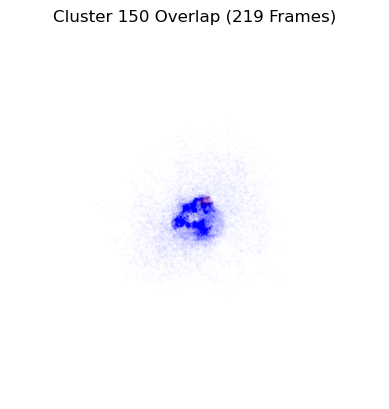

Aligning frames: 100%|████████████████████████| 246/246 [00:02<00:00, 97.78it/s]


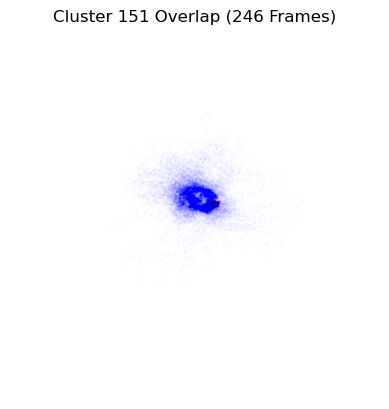

Aligning frames: 100%|███████████████████████| 136/136 [00:00<00:00, 177.97it/s]


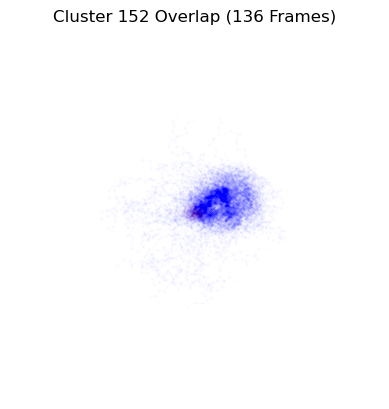

Aligning frames: 100%|█████████████████████████| 91/91 [00:00<00:00, 182.88it/s]


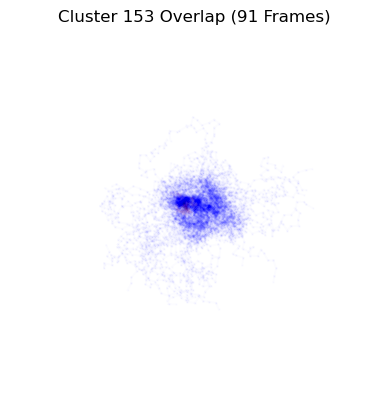

Aligning frames: 100%|███████████████████████| 132/132 [00:00<00:00, 189.03it/s]


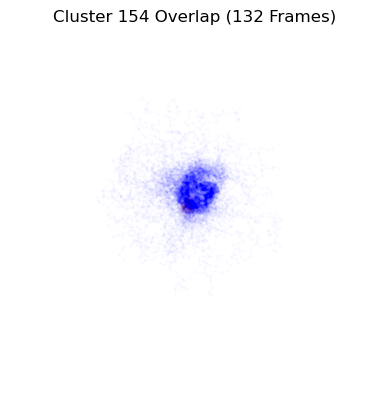

Aligning frames: 100%|████████████████████████| 155/155 [00:01<00:00, 94.50it/s]


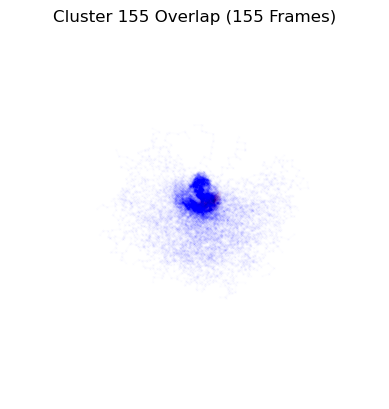

Aligning frames: 100%|████████████████████████| 154/154 [00:01<00:00, 87.95it/s]


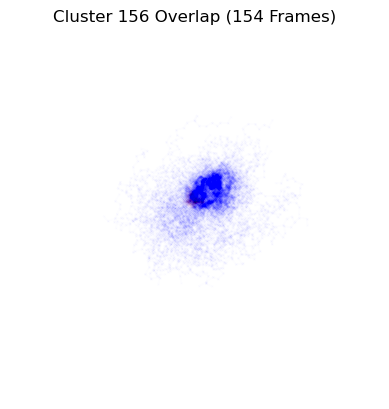

Aligning frames: 100%|█████████████████████████| 52/52 [00:00<00:00, 171.23it/s]


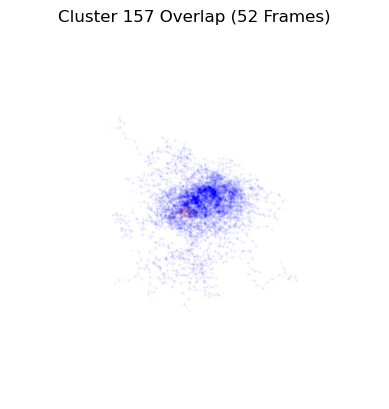

Aligning frames: 100%|███████████████████████| 124/124 [00:00<00:00, 192.75it/s]


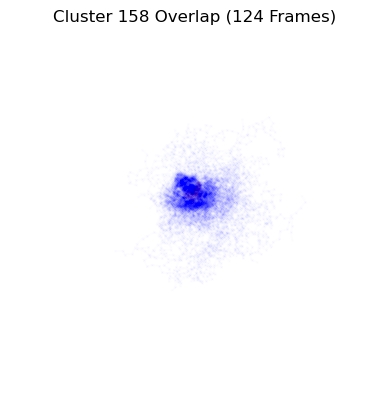

Aligning frames: 100%|███████████████████████| 294/294 [00:01<00:00, 193.40it/s]


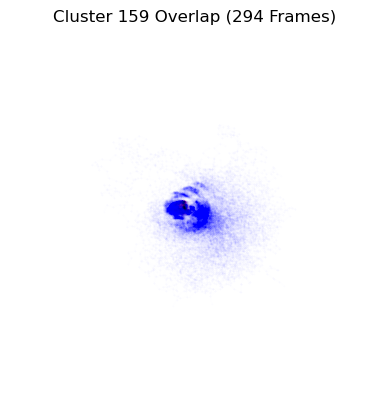

Aligning frames: 100%|████████████████████████| 264/264 [00:02<00:00, 89.23it/s]


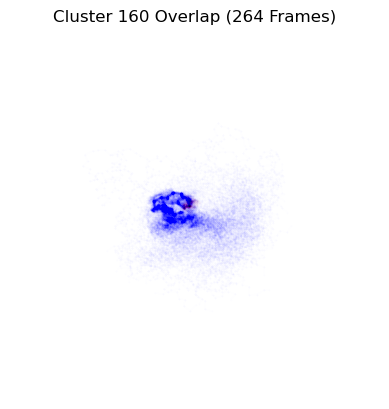

Aligning frames: 100%|███████████████████████| 250/250 [00:01<00:00, 177.12it/s]


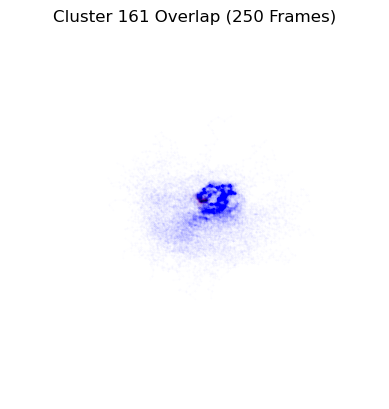

Aligning frames: 100%|████████████████████████| 125/125 [00:01<00:00, 62.57it/s]


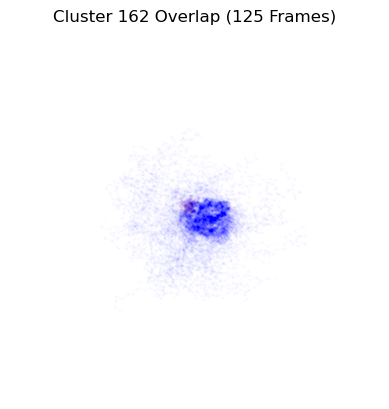

Aligning frames: 100%|███████████████████████| 261/261 [00:02<00:00, 116.89it/s]


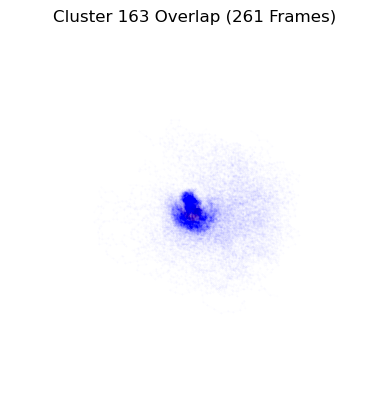

Aligning frames: 100%|███████████████████████| 104/104 [00:00<00:00, 180.29it/s]


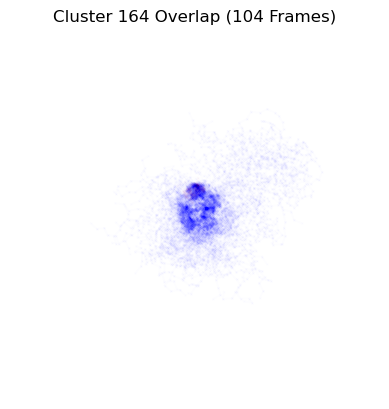

Aligning frames: 100%|███████████████████████| 166/166 [00:00<00:00, 189.96it/s]


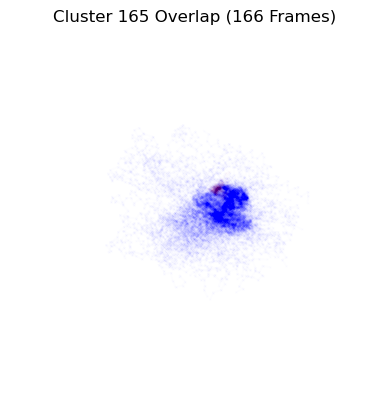

Aligning frames: 100%|███████████████████████| 217/217 [00:02<00:00, 104.62it/s]


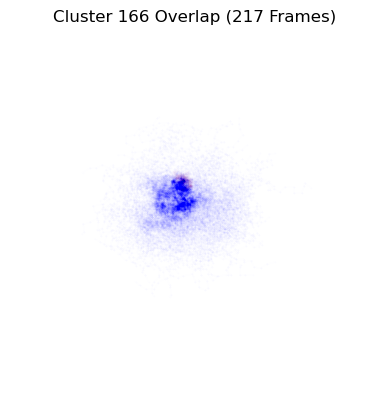

Aligning frames: 100%|███████████████████████| 241/241 [00:01<00:00, 187.96it/s]


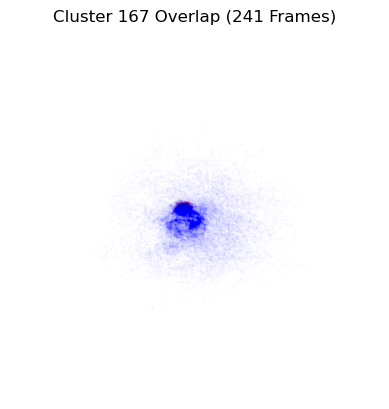

Aligning frames: 100%|███████████████████████| 205/205 [00:01<00:00, 198.62it/s]


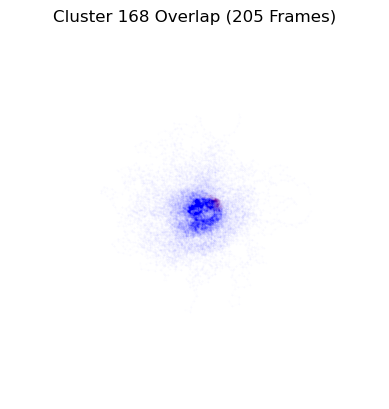

Aligning frames: 100%|█████████████████████████| 85/85 [00:00<00:00, 176.45it/s]


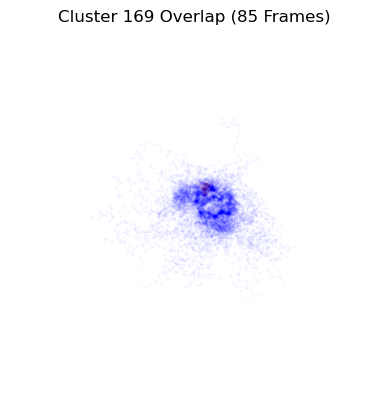

Aligning frames: 100%|███████████████████████| 100/100 [00:00<00:00, 187.36it/s]


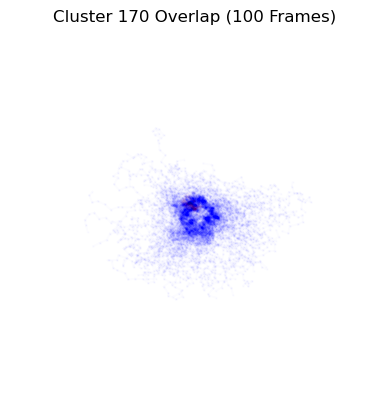

Aligning frames: 100%|███████████████████████| 229/229 [00:01<00:00, 191.91it/s]


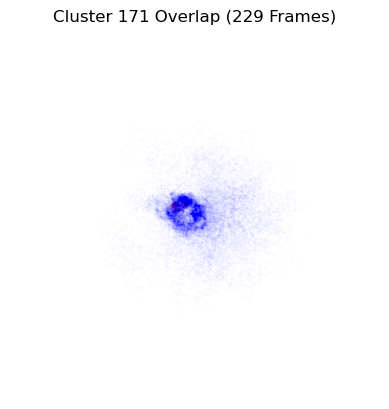

Aligning frames: 100%|████████████████████████| 229/229 [00:02<00:00, 93.73it/s]


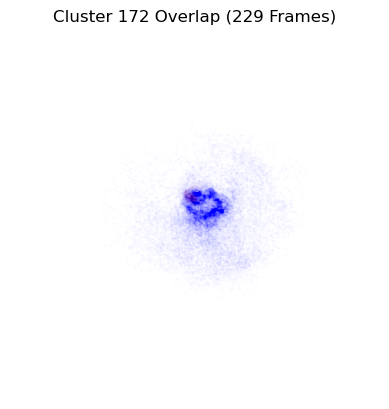

Aligning frames: 100%|███████████████████████| 273/273 [00:02<00:00, 101.14it/s]


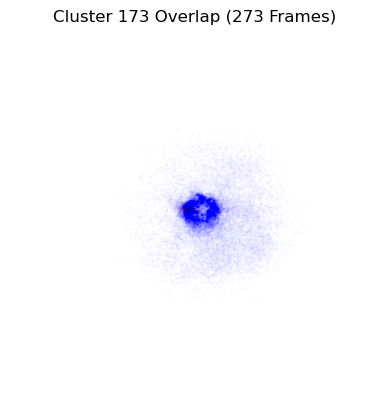

Aligning frames: 100%|███████████████████████| 163/163 [00:00<00:00, 182.72it/s]


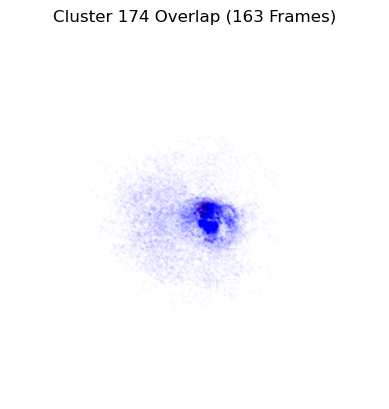

Aligning frames: 100%|███████████████████████| 168/168 [00:00<00:00, 198.28it/s]


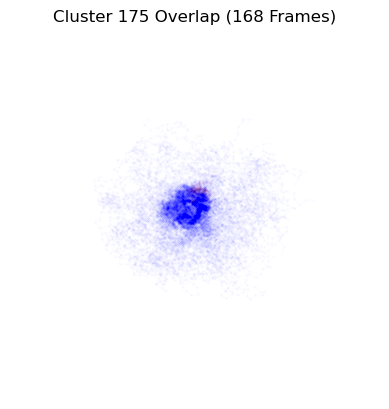

Aligning frames: 100%|███████████████████████| 185/185 [00:00<00:00, 186.89it/s]


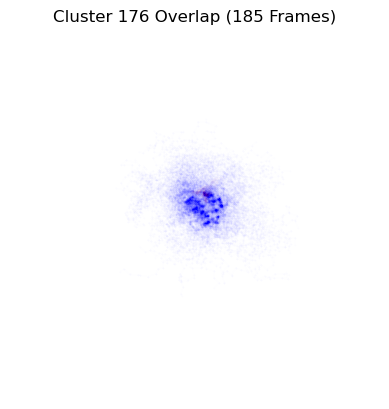

Aligning frames: 100%|███████████████████████| 294/294 [00:01<00:00, 191.95it/s]


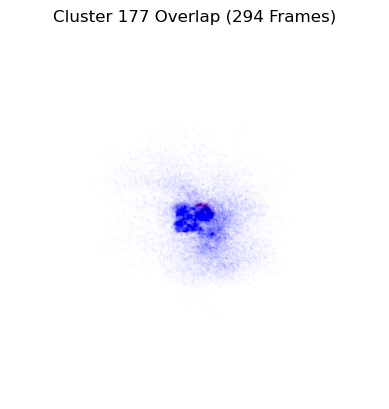

Aligning frames: 100%|███████████████████████| 380/380 [00:03<00:00, 108.34it/s]


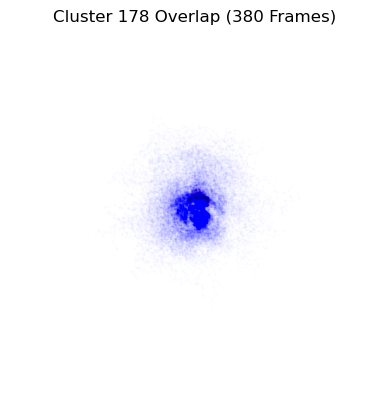

Aligning frames: 100%|████████████████████████| 214/214 [00:03<00:00, 68.37it/s]


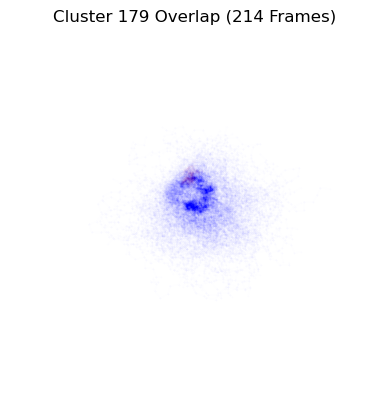

Aligning frames: 100%|███████████████████████| 508/508 [00:03<00:00, 135.33it/s]


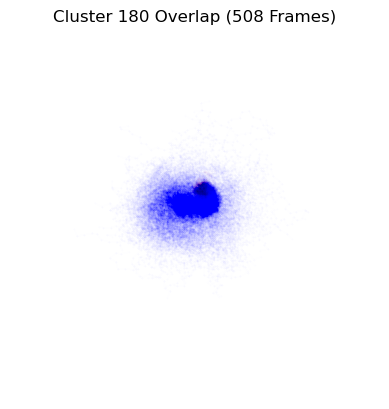

Aligning frames: 100%|████████████████████████| 499/499 [00:05<00:00, 97.81it/s]


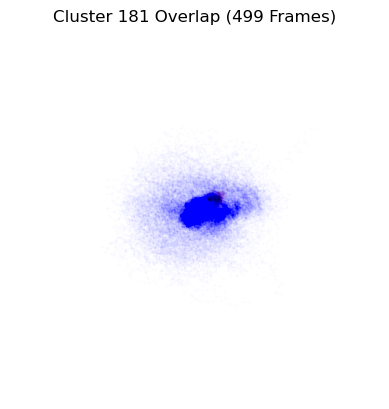

Aligning frames: 100%|███████████████████████| 578/578 [00:05<00:00, 100.72it/s]


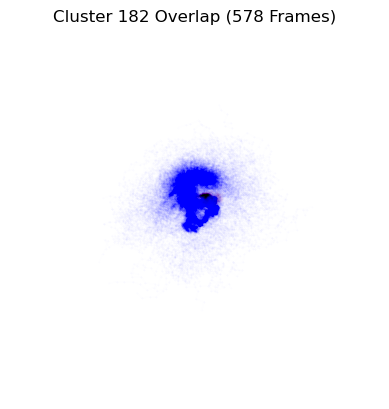

Aligning frames: 100%|███████████████████████| 669/669 [00:06<00:00, 105.42it/s]


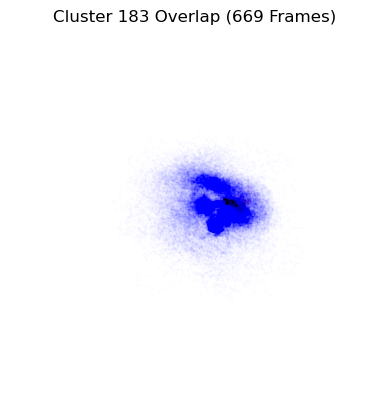

Aligning frames: 100%|████████████████████████| 217/217 [00:04<00:00, 48.91it/s]


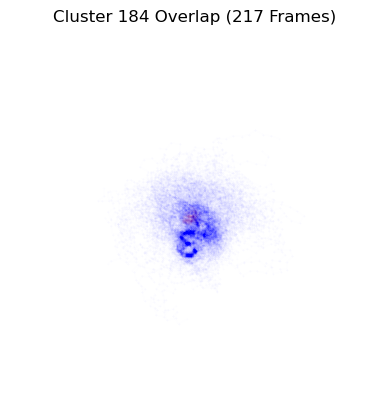

Aligning frames: 100%|████████████████████████| 143/143 [00:01<00:00, 73.73it/s]


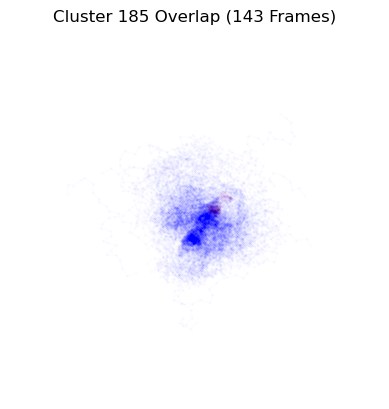

Aligning frames: 100%|███████████████████████| 388/388 [00:02<00:00, 193.12it/s]


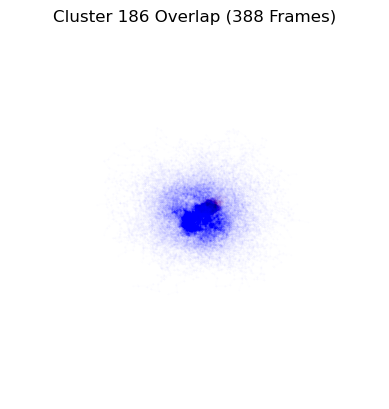

Aligning frames: 100%|███████████████████████| 280/280 [00:01<00:00, 198.23it/s]


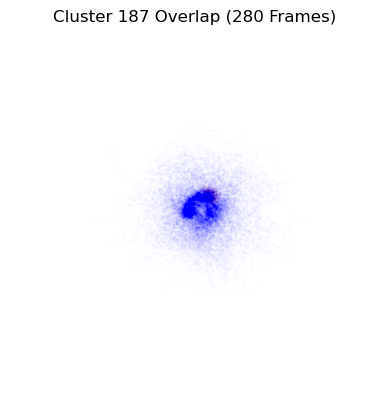

Aligning frames: 100%|███████████████████████| 389/389 [00:03<00:00, 110.16it/s]


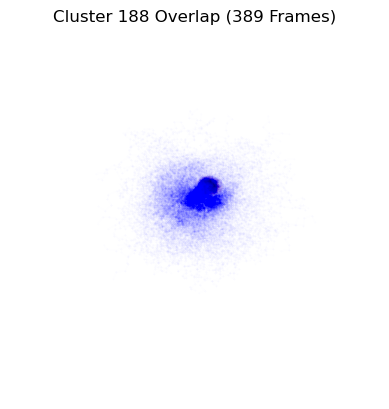

Aligning frames: 100%|███████████████████████| 187/187 [00:01<00:00, 180.32it/s]


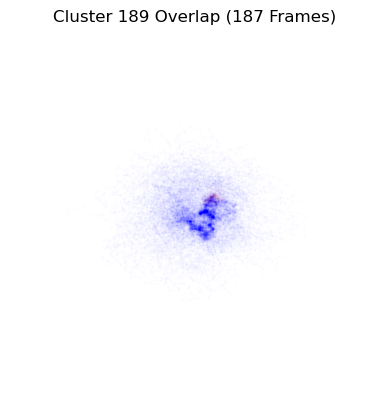

Aligning frames: 100%|███████████████████████| 157/157 [00:00<00:00, 167.13it/s]


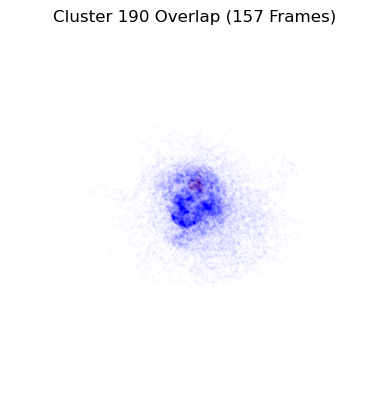

Aligning frames: 100%|███████████████████████| 201/201 [00:01<00:00, 187.78it/s]


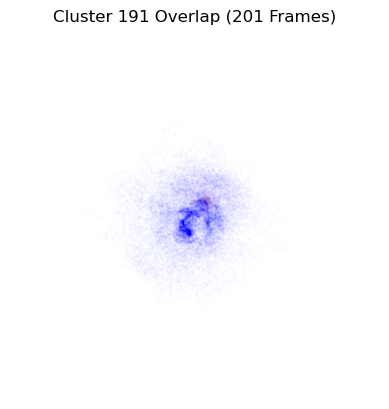

Aligning frames: 100%|███████████████████████| 469/469 [00:03<00:00, 128.19it/s]


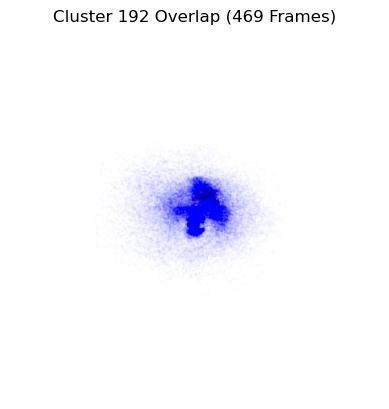

Aligning frames: 100%|████████████████████████| 158/158 [00:03<00:00, 48.33it/s]


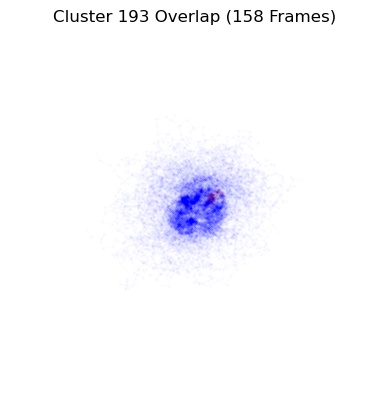

Aligning frames: 100%|███████████████████████| 457/457 [00:03<00:00, 139.41it/s]


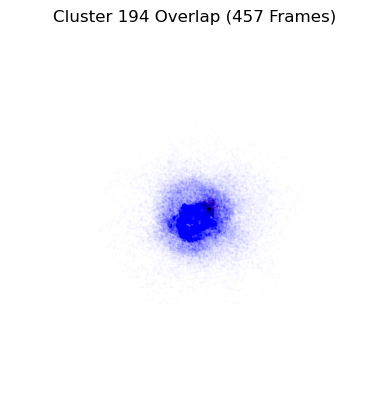

Aligning frames: 100%|███████████████████████| 570/570 [00:02<00:00, 195.91it/s]


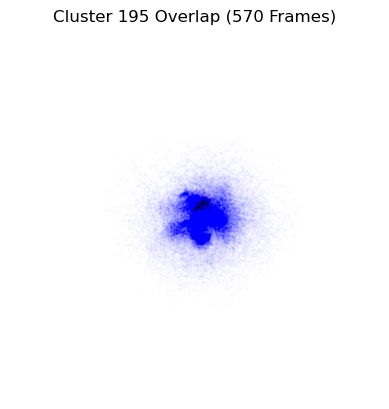

Aligning frames: 100%|███████████████████████| 319/319 [00:01<00:00, 185.49it/s]


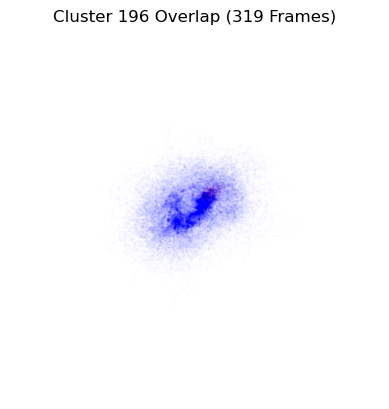

Aligning frames: 100%|███████████████████████| 270/270 [00:01<00:00, 187.35it/s]


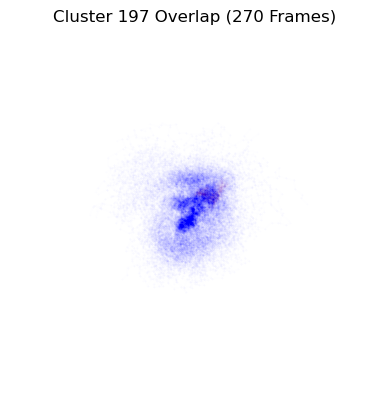

Aligning frames: 100%|███████████████████████| 171/171 [00:00<00:00, 197.35it/s]


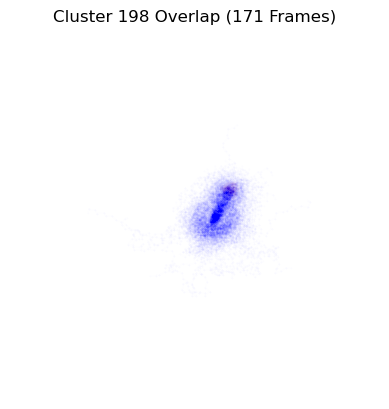

Aligning frames: 100%|███████████████████████| 246/246 [00:02<00:00, 108.43it/s]


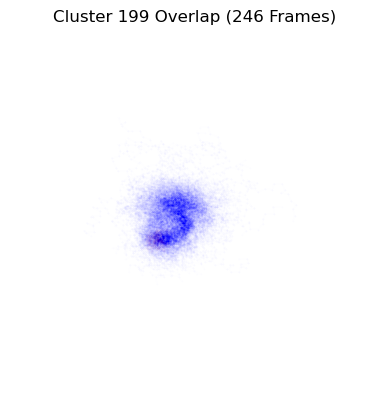

Aligning frames: 100%|███████████████████████| 274/274 [00:01<00:00, 191.55it/s]


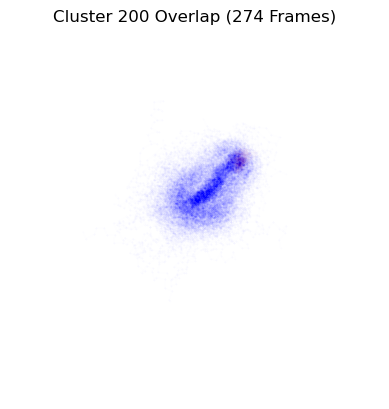

Aligning frames: 100%|███████████████████████| 220/220 [00:01<00:00, 188.95it/s]


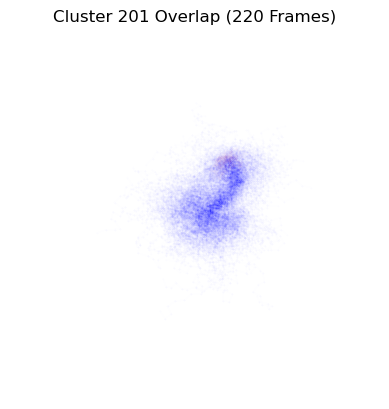

Aligning frames: 100%|███████████████████████| 127/127 [00:00<00:00, 163.84it/s]


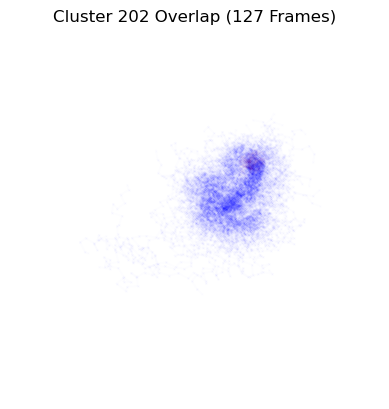

Aligning frames: 100%|███████████████████████| 164/164 [00:00<00:00, 196.47it/s]


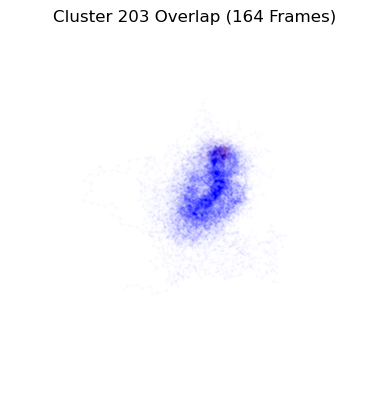

Aligning frames: 100%|███████████████████████| 113/113 [00:00<00:00, 184.68it/s]


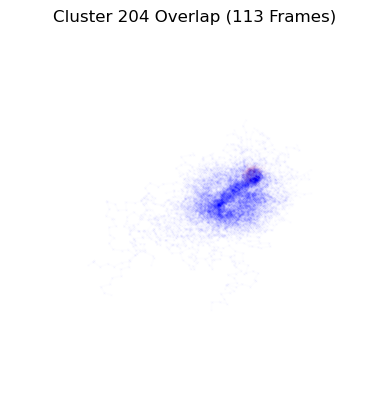

Aligning frames: 100%|████████████████████████| 114/114 [00:01<00:00, 82.10it/s]


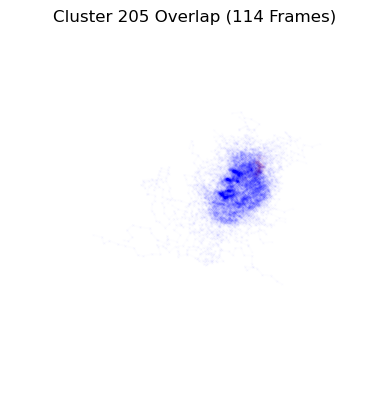

Aligning frames: 100%|██████████████████████████| 91/91 [00:01<00:00, 74.56it/s]


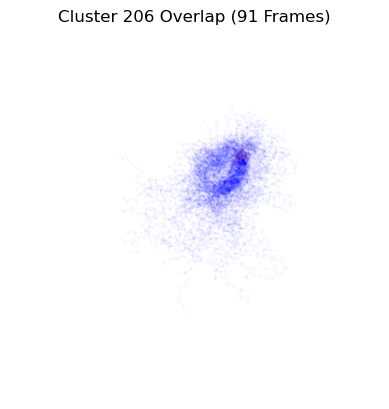

Aligning frames: 100%|███████████████████████| 180/180 [00:00<00:00, 193.43it/s]


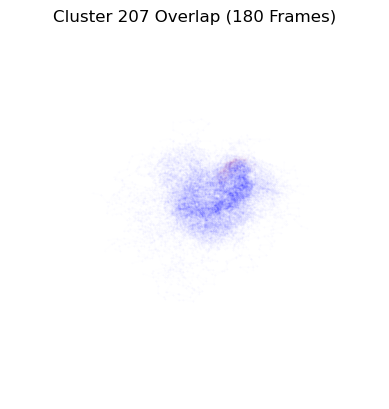

Aligning frames: 100%|███████████████████████| 120/120 [00:00<00:00, 189.66it/s]


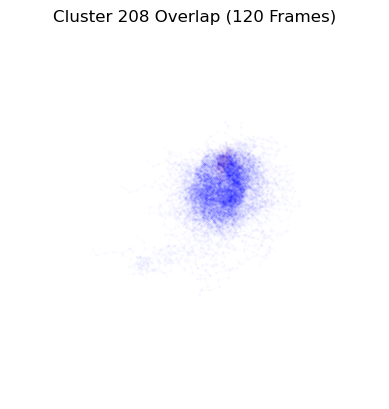

Aligning frames: 100%|███████████████████████| 145/145 [00:00<00:00, 189.57it/s]


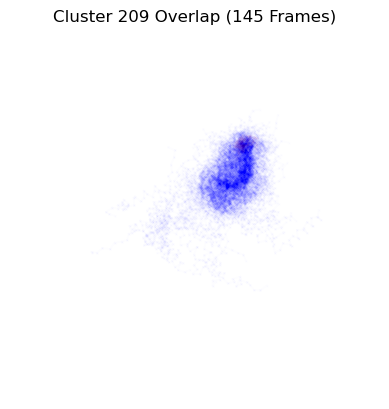

Aligning frames: 100%|███████████████████████| 105/105 [00:00<00:00, 195.85it/s]


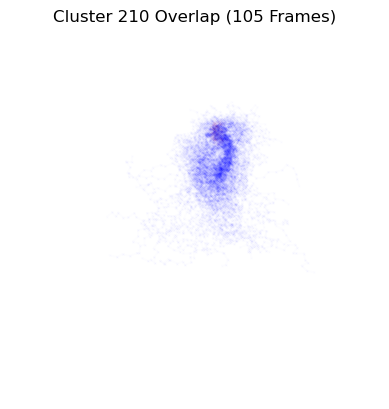

Aligning frames: 100%|███████████████████████| 104/104 [00:00<00:00, 201.96it/s]


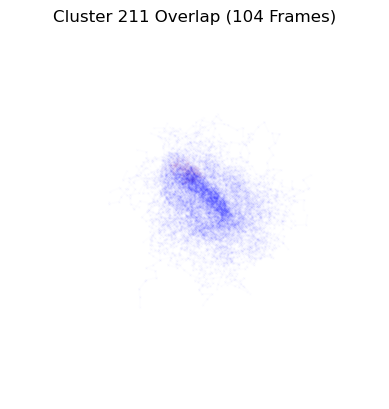

Aligning frames: 100%|███████████████████████| 175/175 [00:00<00:00, 190.57it/s]


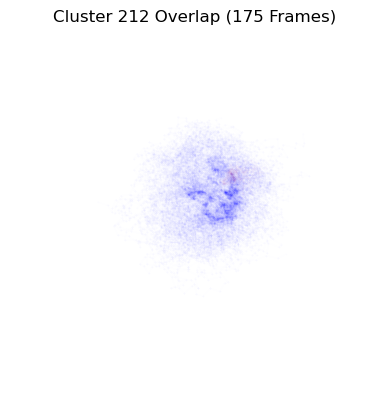

Aligning frames: 100%|███████████████████████| 279/279 [00:01<00:00, 199.96it/s]


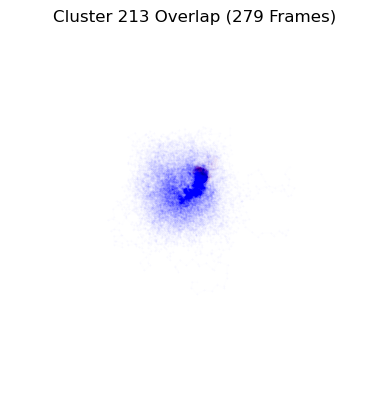

Aligning frames: 100%|███████████████████████| 342/342 [00:01<00:00, 188.68it/s]


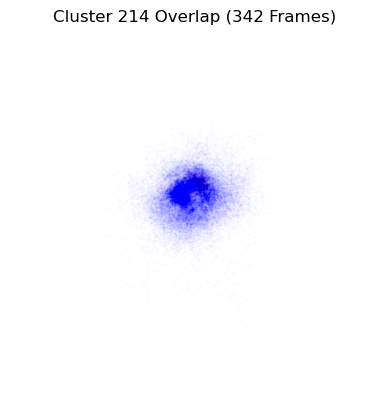

Aligning frames: 100%|███████████████████████| 217/217 [00:01<00:00, 199.35it/s]


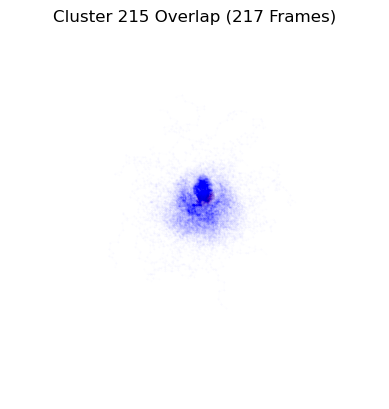

Aligning frames: 100%|███████████████████████| 133/133 [00:00<00:00, 184.81it/s]


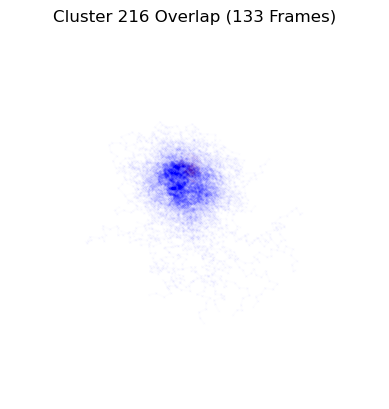

Aligning frames: 100%|███████████████████████| 437/437 [00:02<00:00, 196.37it/s]


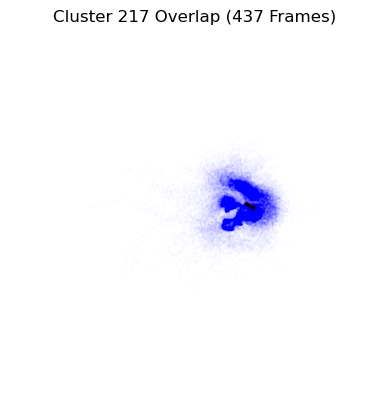

Aligning frames: 100%|███████████████████████| 465/465 [00:02<00:00, 193.48it/s]


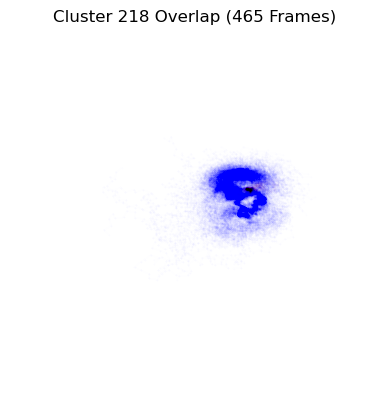

Aligning frames: 100%|███████████████████████| 332/332 [00:01<00:00, 187.94it/s]


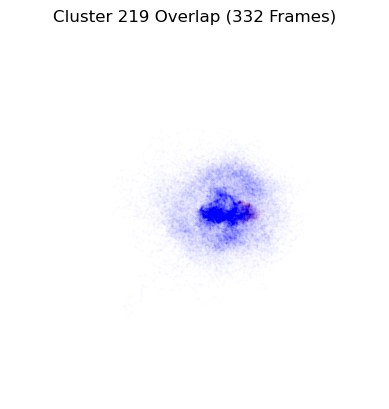

Aligning frames: 100%|███████████████████████| 378/378 [00:01<00:00, 197.93it/s]


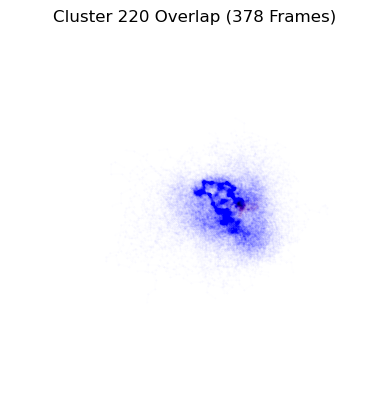

Aligning frames: 100%|████████████████████████| 206/206 [00:03<00:00, 66.55it/s]


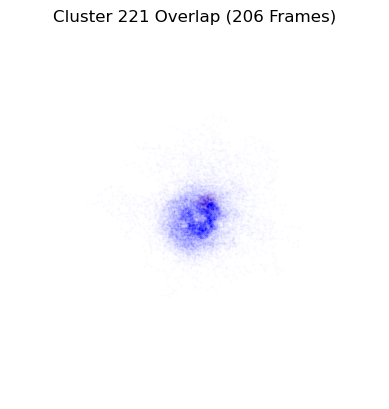

Aligning frames: 100%|███████████████████████| 168/168 [00:00<00:00, 187.35it/s]


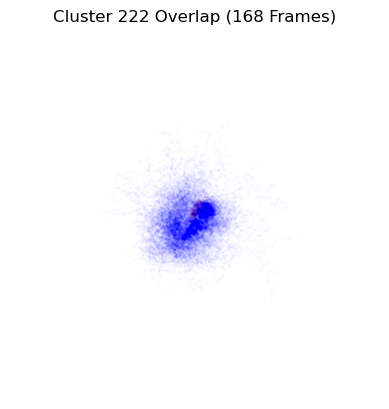

Aligning frames: 100%|███████████████████████| 241/241 [00:01<00:00, 200.76it/s]


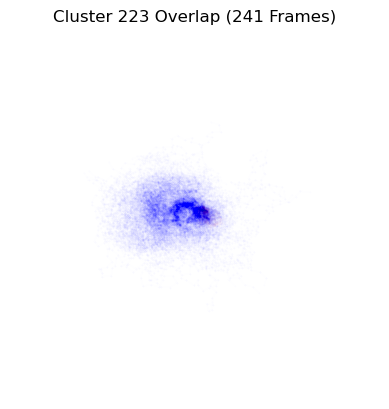

Aligning frames: 100%|███████████████████████| 385/385 [00:02<00:00, 188.20it/s]


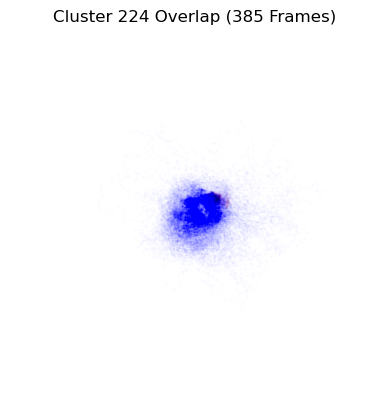

Aligning frames: 100%|███████████████████████| 551/551 [00:05<00:00, 110.08it/s]


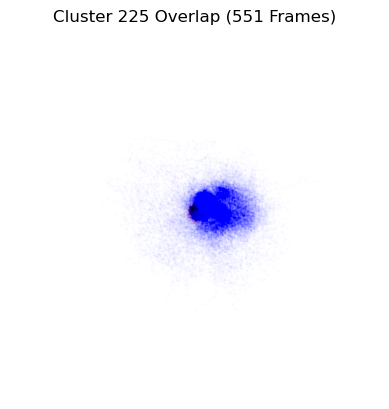

Aligning frames: 100%|███████████████████████| 377/377 [00:02<00:00, 183.59it/s]


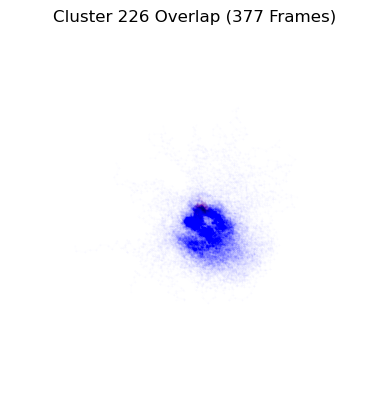

Aligning frames: 100%|███████████████████████| 489/489 [00:02<00:00, 198.59it/s]


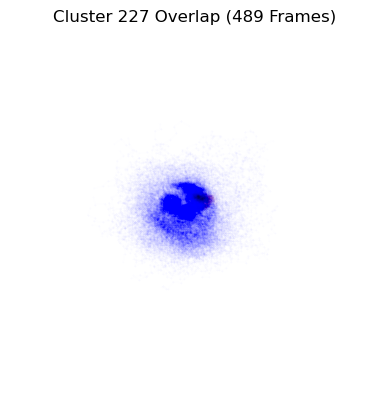

Aligning frames: 100%|████████████████████████| 320/320 [00:04<00:00, 78.73it/s]


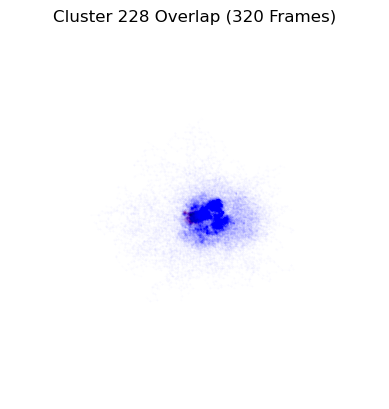

Aligning frames: 100%|███████████████████████| 281/281 [00:01<00:00, 189.13it/s]


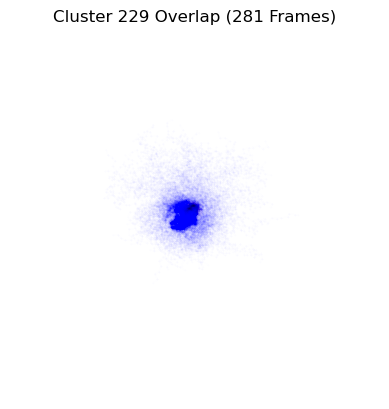

Aligning frames: 100%|███████████████████████| 340/340 [00:01<00:00, 189.48it/s]


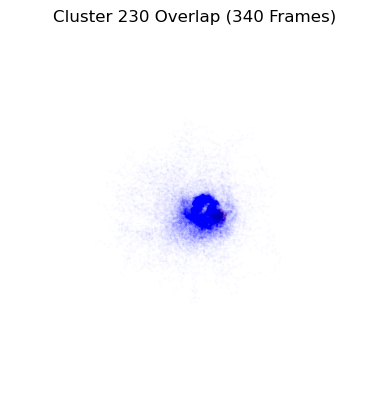

Aligning frames: 100%|███████████████████████| 262/262 [00:01<00:00, 191.17it/s]


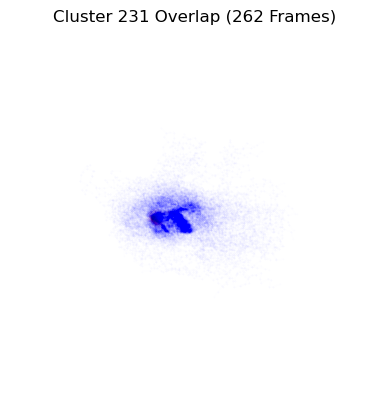

Aligning frames: 100%|███████████████████████| 330/330 [00:01<00:00, 191.37it/s]


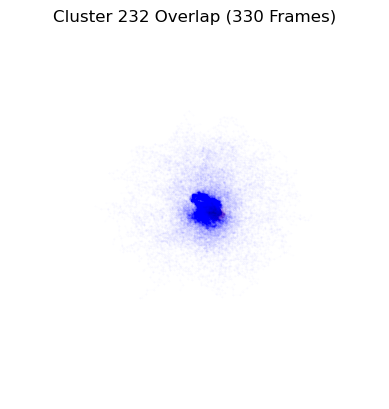

Aligning frames: 100%|███████████████████████| 417/417 [00:02<00:00, 193.94it/s]


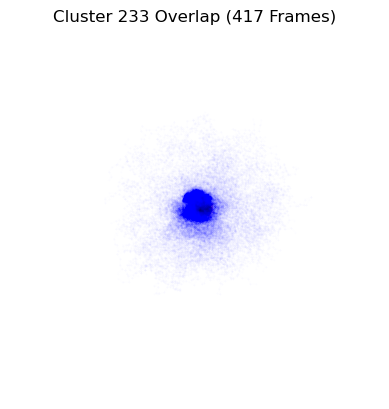

Aligning frames: 100%|████████████████████████| 308/308 [00:03<00:00, 81.91it/s]


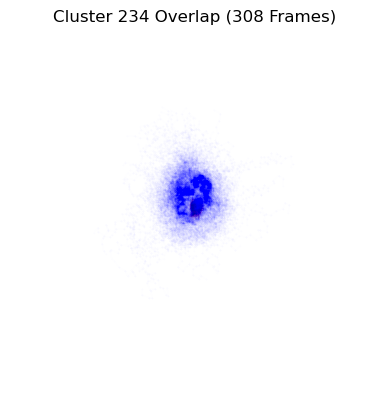

Aligning frames: 100%|███████████████████████| 390/390 [00:03<00:00, 107.05it/s]


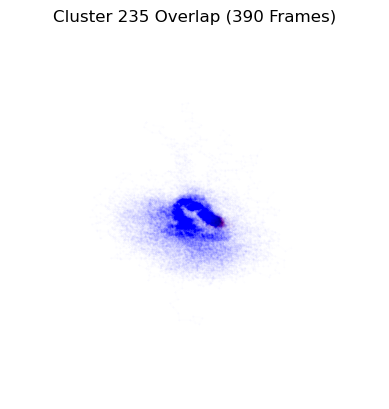

Aligning frames: 100%|███████████████████████| 480/480 [00:04<00:00, 106.74it/s]


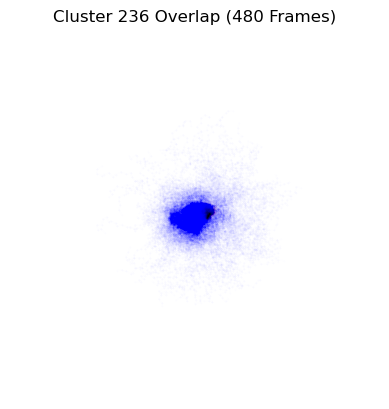

Aligning frames: 100%|████████████████████████| 505/505 [00:05<00:00, 94.06it/s]


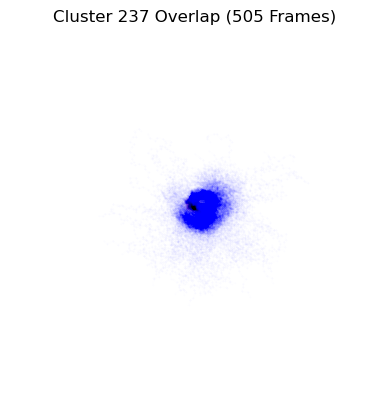

Aligning frames: 100%|█████████████████████| 1181/1181 [00:09<00:00, 130.86it/s]


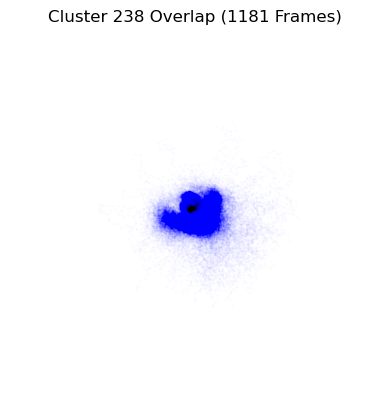

Aligning frames: 100%|███████████████████████| 289/289 [00:01<00:00, 155.65it/s]


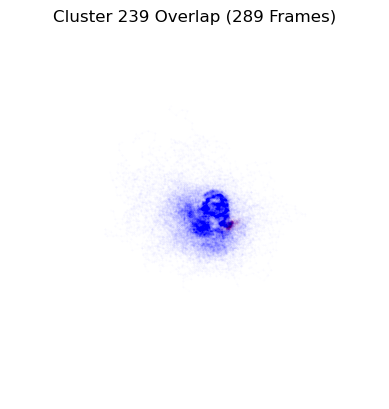

Aligning frames: 100%|███████████████████████| 498/498 [00:04<00:00, 120.66it/s]


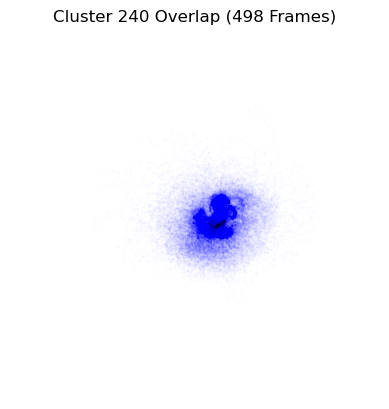

Aligning frames: 100%|████████████████████████| 388/388 [00:04<00:00, 83.43it/s]


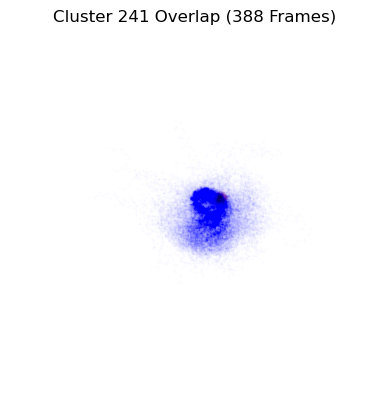

Aligning frames: 100%|████████████████████████| 415/415 [00:04<00:00, 96.07it/s]


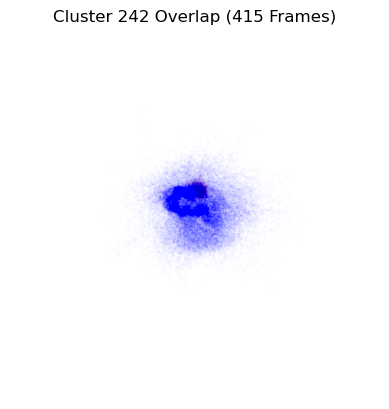

Aligning frames: 100%|███████████████████████| 269/269 [00:01<00:00, 177.10it/s]


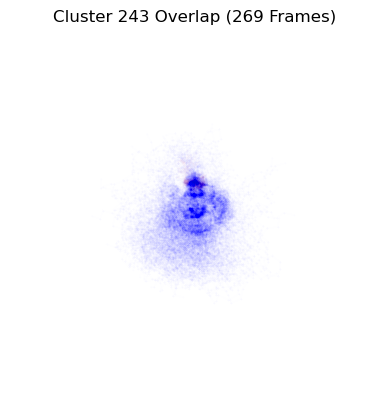

Aligning frames: 100%|███████████████████████| 254/254 [00:01<00:00, 179.20it/s]


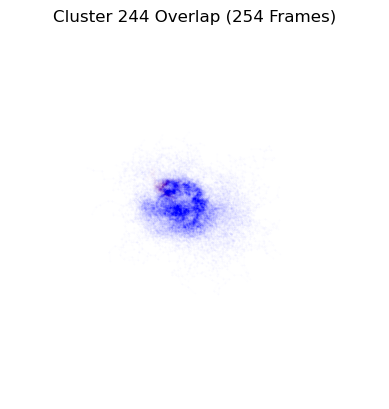

Aligning frames: 100%|███████████████████████| 174/174 [00:00<00:00, 177.78it/s]


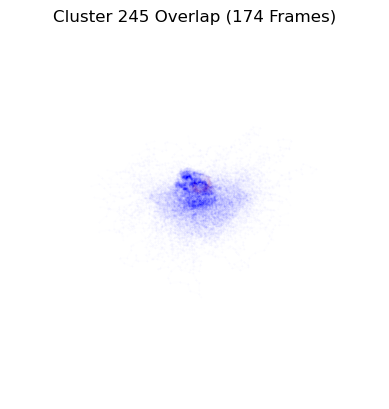

Aligning frames: 100%|███████████████████████| 350/350 [00:03<00:00, 101.64it/s]


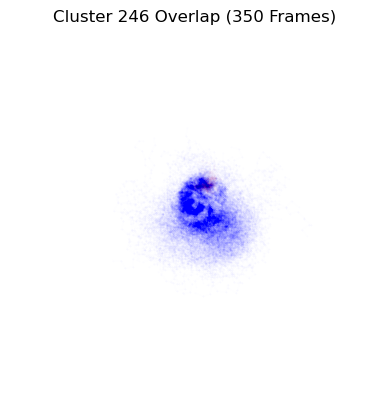

Aligning frames: 100%|███████████████████████| 606/606 [00:03<00:00, 197.82it/s]


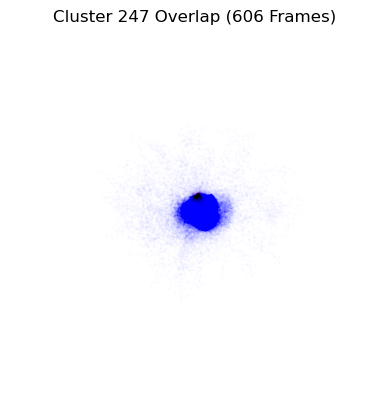

Aligning frames: 100%|███████████████████████| 399/399 [00:02<00:00, 184.38it/s]


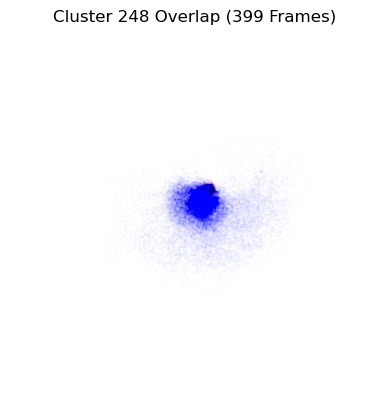

Aligning frames: 100%|███████████████████████| 260/260 [00:01<00:00, 186.35it/s]


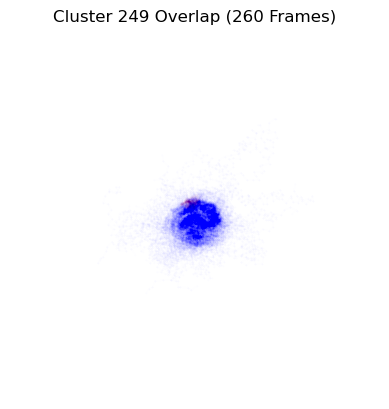

Aligning frames: 100%|████████████████████████| 215/215 [00:02<00:00, 82.21it/s]


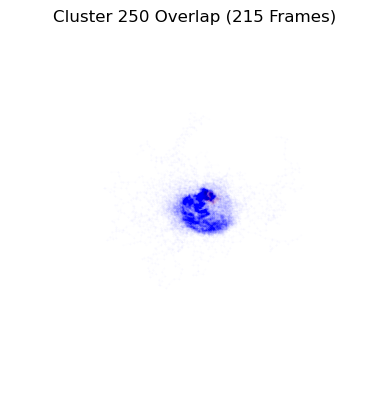

Aligning frames: 100%|███████████████████████| 417/417 [00:03<00:00, 123.48it/s]


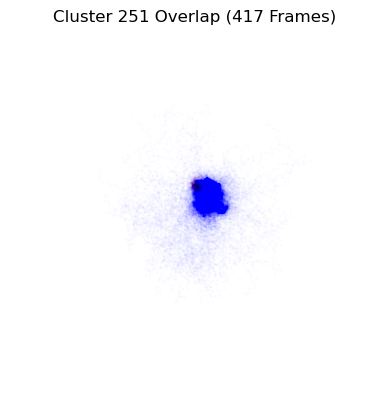

Aligning frames: 100%|████████████████████████| 425/425 [00:04<00:00, 97.10it/s]


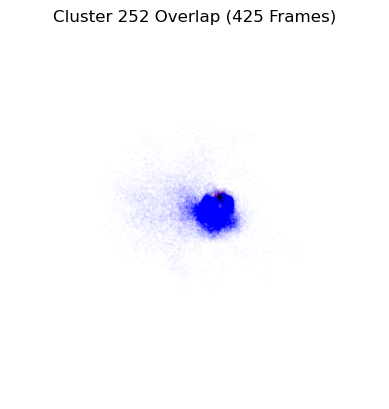

Aligning frames: 100%|███████████████████████| 491/491 [00:02<00:00, 191.96it/s]


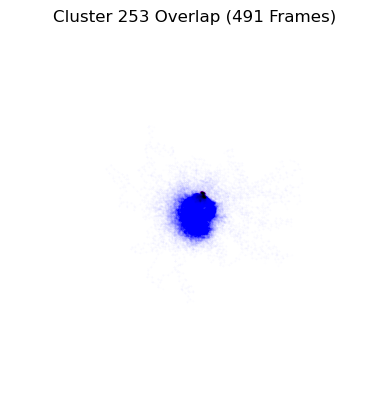

Aligning frames: 100%|████████████████████████| 343/343 [00:04<00:00, 79.36it/s]


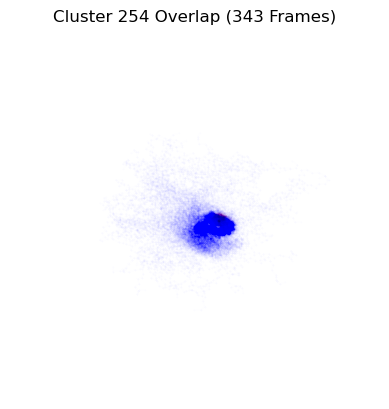

Aligning frames: 100%|███████████████████████| 569/569 [00:03<00:00, 178.84it/s]


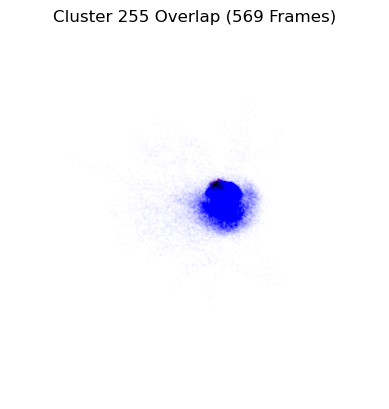

Aligning frames: 100%|████████████████████████| 192/192 [00:03<00:00, 48.88it/s]


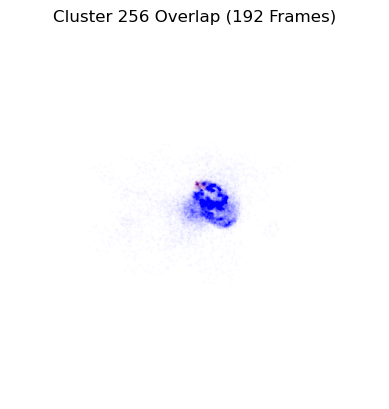

Aligning frames: 100%|█████████████████████████| 86/86 [00:00<00:00, 176.98it/s]


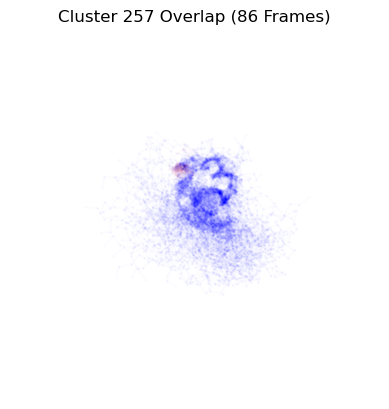

Aligning frames: 100%|███████████████████████| 310/310 [00:01<00:00, 197.01it/s]


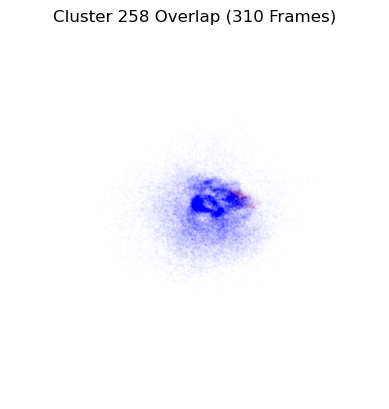

Aligning frames: 100%|█████████████████████████| 30/30 [00:00<00:00, 174.04it/s]


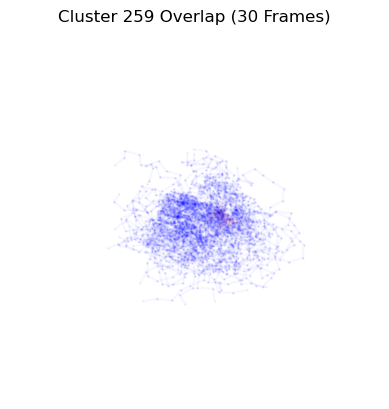

Aligning frames: 100%|█████████████████████████| 79/79 [00:00<00:00, 189.04it/s]


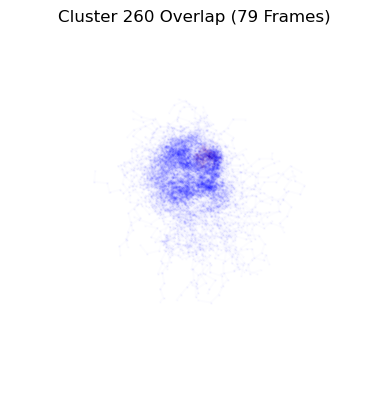

Aligning frames: 100%|███████████████████████| 252/252 [00:02<00:00, 113.00it/s]


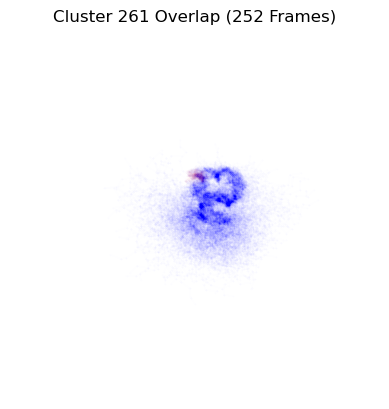

Aligning frames: 100%|███████████████████████| 111/111 [00:00<00:00, 162.71it/s]


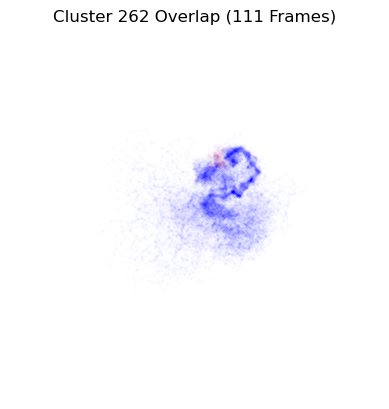

Aligning frames: 100%|███████████████████████| 218/218 [00:01<00:00, 113.33it/s]


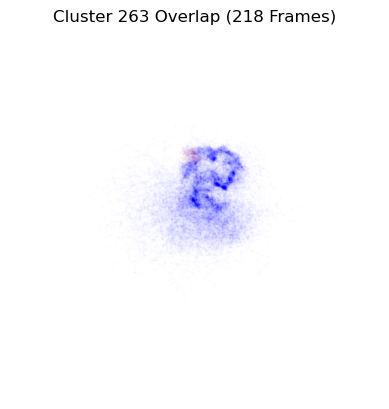

Aligning frames: 100%|████████████████████████| 122/122 [00:02<00:00, 60.78it/s]


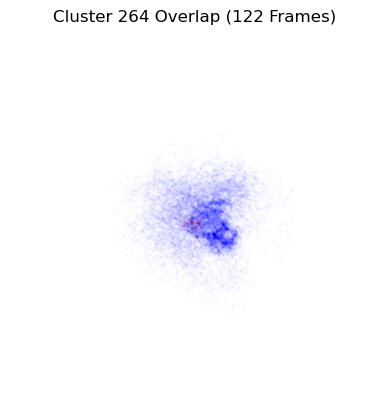

Aligning frames: 100%|████████████████████████| 158/158 [00:02<00:00, 77.00it/s]


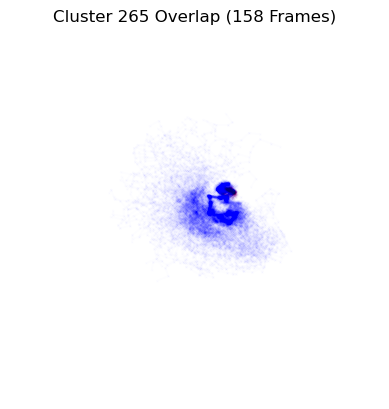

Aligning frames: 100%|███████████████████████| 110/110 [00:00<00:00, 187.89it/s]


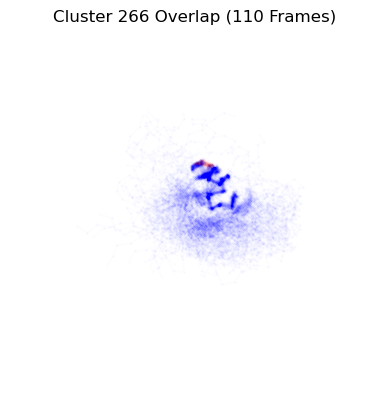

In [20]:
# Define the function to extract frames from both universes
def extract_frames(indices, universe1, universe2, switch_index=40000):
    frames = []
    for idx in tqdm(indices, desc="Extracting frames"):
        if idx < switch_index:
            universe1.trajectory[idx]
            frames.append(universe1.select_atoms("name CA").positions.copy())
        else:
            universe2.trajectory[idx - switch_index]
            frames.append(universe2.select_atoms("name CA").positions.copy())
    return frames

# Create a temporary Universe for alignment
def create_temp_universe(positions, universe):
    temp_universe = mda.Merge(universe.select_atoms("name CA"))
    temp_universe.atoms.positions = positions
    return temp_universe

# Align frames using AlignTraj
def align_frames(reference_universe, frames, select_for_alignment):
    aligned_frames = []
    for frame_positions in tqdm(frames, desc="Aligning frames"):
        temp_universe = create_temp_universe(frame_positions, reference_universe)
        aligner = align.AlignTraj(temp_universe, reference_universe, select=select_for_alignment, in_memory=True)
        aligner.run()
        aligned_frames.append(temp_universe.atoms.positions.copy())
    return aligned_frames

# Selection string for residues 15-30 to ensure alignment of corresponding residues
select_residues_15_30 = "resid 15-30 and name CA"

# Function to plot aligned frames for a given cluster
def plot_aligned_frames(cluster_id, indices):
    # Extract frames for the cluster
    frames = extract_frames(indices, u1, u2)
    
    # Create reference universe for alignment
    reference_universe = create_temp_universe(frames[0], u1)
    
    # Align frames using the specific residues 15-30
    aligned_frames = align_frames(reference_universe, frames, select_residues_15_30)
    
    # Set the opacity value with a minimum threshold
    opacity = max(1 / len(aligned_frames), 0.002)
    
    # Plot the aligned frames from different angles
    angles = [(30, 30)]
    
    for angle in angles:
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        
        # Plot cluster frames with lines connecting the alpha carbons
        for positions in aligned_frames:
            for i in range(len(positions) - 1):
                color = 'red' if i == 14 else 'blue'  # 14 is the index for alpha carbon 15
                ax.plot(positions[i:i+2, 0], positions[i:i+2, 1], positions[i:i+2, 2], 
                        'o-', color=color, markersize=1, markeredgewidth=0.8, alpha=opacity)
        
        ax.view_init(elev=angle[0], azim=angle[1])
        ax.set_axis_off()  # Remove axes
        ax.grid(False)     # Remove grid lines
        plt.title(f'Cluster {cluster_id} Overlap ({len(aligned_frames)} Frames)')
        plt.show()

# Group the DataFrame by 'cluster' and get the indices for each cluster
cluster_indices = latent.groupby('cluster').apply(lambda df: df.index.tolist()).to_dict()

# Plot aligned frames for each cluster
for cluster_id, indices in cluster_indices.items():
    plot_aligned_frames(cluster_id, indices)

# Residue 105 in Black, Residue 120 in Blue, Rest in Red

In [ ]:
# Define the function to extract frames from both universes
def extract_frames(indices, universe1, universe2, switch_index=40000):
    frames = []
    for idx in tqdm(indices, desc="Extracting frames"):
        if idx < switch_index:
            universe1.trajectory[idx]
            frames.append(universe1.select_atoms("name CA").positions.copy())
        else:
            universe2.trajectory[idx - switch_index]
            frames.append(universe2.select_atoms("name CA").positions.copy())
    return frames

# Create a temporary Universe for alignment
def create_temp_universe(positions, universe):
    temp_universe = mda.Merge(universe.select_atoms("name CA"))
    temp_universe.atoms.positions = positions
    return temp_universe

# Align frames using AlignTraj
def align_frames(reference_universe, frames, select_for_alignment):
    aligned_frames = []
    for frame_positions in tqdm(frames, desc="Aligning frames"):
        temp_universe = create_temp_universe(frame_positions, reference_universe)
        aligner = align.AlignTraj(temp_universe, reference_universe, select=select_for_alignment, in_memory=True)
        aligner.run()
        aligned_frames.append(temp_universe.atoms.positions.copy())
    return aligned_frames

# Selection string for residues 15-30 to ensure alignment of corresponding residues
select_residues_15_30 = "resid 15-30 and name CA"

# Function to plot aligned frames for a given cluster
def plot_aligned_frames(cluster_id, indices):
    # Extract frames for the cluster
    frames = extract_frames(indices, u1, u2)
    
    # Create reference universe for alignment
    reference_universe = create_temp_universe(frames[0], u1)
    
    # Align frames using the specific residues 15-30
    aligned_frames = align_frames(reference_universe, frames, select_residues_15_30)
    
    # Set the opacity value with a minimum threshold
    opacity = max(1 / len(aligned_frames), 0.002)
    
    # Plot the aligned frames from different angles
    angles = [(30, 30)]
    
    for angle in angles:
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        
        # Plot cluster frames with lines connecting the alpha carbons
        for positions in aligned_frames:
            for i in range(len(positions) - 1):
                if i == 14:
                    color = 'black'  # alpha carbon 15
                elif i == 29:
                    color = 'blue'  # alpha carbon 30
                else:
                    color = 'red'
                ax.plot(positions[i:i+2, 0], positions[i:i+2, 1], positions[i:i+2, 2], 
                        'o-', color=color, markersize=1, markeredgewidth=0.8, alpha=opacity)
        
        ax.view_init(elev=angle[0], azim=angle[1])
        ax.set_axis_off()  # Remove axes
        ax.grid(False)     # Remove grid lines
        plt.title(f'Cluster {cluster_id} Overlap ({len(aligned_frames)} Frames)')
        plt.show()

# Group the DataFrame by 'cluster' and get the indices for each cluster
cluster_indices = latent.groupby('cluster').apply(lambda df: df.index.tolist()).to_dict()

# Plot aligned frames for each cluster
for cluster_id, indices in cluster_indices.items():
    plot_aligned_frames(cluster_id, indices)

# Further Analysis:
- Cluster Lifespan
- Transition Preference

In [ ]:
# Step 1: Sort the dataframe by index
latent_sorted = latent.sort_index()

# Step 2: Initialize variables
cluster_durations = []
current_cluster = None
current_duration = 0

# Step 3: Iterate through the sorted dataframe to count consecutive frames in each cluster
for idx, row in latent_sorted.iterrows():
    cluster = row['cluster']
    if cluster == current_cluster:
        current_duration += 1
    else:
        if current_cluster is not None:
            cluster_durations.append((current_cluster, current_duration))
        current_cluster = cluster
        current_duration = 1

# Append the last cluster duration
if current_cluster is not None:
    cluster_durations.append((current_cluster, current_duration))

# Convert the list of durations to a dataframe for easier analysis
durations_df = pd.DataFrame(cluster_durations, columns=['Cluster', 'Duration'])

# Display the dataframe
print(durations_df)